# Machine Learning and Graph Analysis



## Supervised and Unsupervised learning

### 1. Supervised Learning

#### Naive Bayes



In [1]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
import pandas as pd


class NaiveBayes():
    def __init__(self, count_vectorizer, alpha=1):
        super().__init__()
        self.cv = count_vectorizer # converts text data into numerical representations
        self.num_classes = None
        self.classes = None
        self.number_of_features = None
        self.number_of_samples = None
        self.prior = None
        self.feature_probabilities = None # conditional probabilities of features given a class
        self.log_probs = None
        self.alpha = alpha # smoothing parameter for Laplace smoothing.
        # It prevents zero probabilities by adding a small constant to the frequency counts.

        # After processing the text with CountVectorizer, the text is converted into a matrix where:
        # Rows correspond to individual samples (e.g., reviews).
        # Columns correspond to specific words in the vocabulary.
        # Each cell contains the count of how many times a word appears in a sample.
        # Thus, each word in the vocabulary is treated as a feature, and the counts or presence of those words are the feature values.

    def fit(self, x, y):
        """
        Fit the features and the labels
        Calculate prior and feature probabilities

        Parameters
        ----------
        x: np.ndarray
            An m * n matrix - m is count of docs and n is embedding size

        y: np.ndarray
            The real class label for each doc

        Returns
        -------
        self
            Returns self as a classifier
        """
        self.classes = np.unique(y)
        self.prior = {}
        self.feature_probabilities = {}

        for cls in self.classes:
            x_cls = x[y == cls]
            # Prior probabilities
            self.prior[cls] = x_cls.shape[0] / x.shape[0]
            # Laplace smoothing
            # P(feature|class) = ((freq of feature in the class) + alpha) / (total words in the class + alpha * vocab size)
            self.feature_probabilities[cls] = (x_cls.sum(axis=0) + self.alpha) / (x_cls.sum() + self.alpha * x.shape[1])

    def predict(self, x):
        """
        Parameters
        ----------
        x: np.ndarray
            An k * n matrix - k is count of docs and n is embedding size
        Returns
        -------
        np.ndarray
            Return the predicted class for each doc
            with the highest probability (argmax)
        """

        # P(class|X) = P(X|class) * P(class)
        # log(P(class|X)) = sigma(log(P(xi|class))*count(xi)) + log(P(class))
        # prediction = argmax log(P(class|X))

        log_probs = []
        for cls in self.classes:
            log_prob = np.log(self.prior[cls]) + x @ np.log(self.feature_probabilities[cls].T).A1
            log_probs.append(log_prob)
        log_probs = np.array(log_probs).T
        return self.classes[np.argmax(log_probs, axis=1)]

    def prediction_report(self, x, y):
        """
        Parameters
        ----------
        x: np.ndarray
            An k * n matrix - k is count of docs and n is embedding size
        y: np.ndarray
            The real class label for each doc
        Returns
        -------
        str
            Return the classification report
        """
        predictions = self.predict(x)
        return classification_report(y, predictions)

    def get_percent_of_positive_reviews(self, sentences):
        """
        You have to override this method because we are using a different embedding method in this class.
        """
        x = self.cv.transform(sentences)
        predictions = self.predict(x)
        positive_count = np.sum(predictions == 'positive')
        return (positive_count / len(sentences)) * 100


    def load_data(self):
        """
        Load the data from the csv file and preprocess the text. Then save the normalized tokens and the sentiment labels.
        """
        df = pd.read_csv("imdb_dataset.csv")
        df['review'] = df['review'].str.lower().str.replace('[^a-z\s]', '', regex=True)
        return df['review'].values, df['sentiment'].values

    def split_data(self, x, y, test_data_ratio=0.2):
        """
        Split the data into training and testing data.

        Parameters
        ----------
        test_data_ratio: float
            The ratio of the test data
        Returns
        -------
        np.ndarray, np.ndarray, np.ndarray, np.ndarray
            Return the training and testing data for the embeddings and the sentiments.
            in the order of x_train, x_test, y_train, y_test
        """
        return train_test_split(x, y, test_size=test_data_ratio, random_state=42)


if __name__ == '__main__':
    """
    First, find the embeddings of the reviews using the CountVectorizer, then fit the model with the training data.
    Finally, predict the test data and print the classification report
    You can use scikit-learn's CountVectorizer to find the embeddings.
    """

    count_vectorizer = CountVectorizer()
    nb_model = NaiveBayes(count_vectorizer=count_vectorizer)

    # Loading and preprocessing data
    reviews, sentiments = nb_model.load_data()

    # Vectorizing the text data
    embeddings = count_vectorizer.fit_transform(reviews)

    # Splitting data
    x_train, x_test, y_train, y_test = nb_model.split_data(embeddings, sentiments)

    # Training Naive Bayes model
    nb_model.fit(x_train, y_train)

    # Evaluating model
    print(nb_model.prediction_report(x_test, y_test))


<>:113: SyntaxWarning: invalid escape sequence '\s'
<>:113: SyntaxWarning: invalid escape sequence '\s'
/var/folders/f0/mfqvpbdd2gg6g3qmzpg6p4f40000gn/T/ipykernel_3144/3133097504.py:113: SyntaxWarning: invalid escape sequence '\s'
  df['review'] = df['review'].str.lower().str.replace('[^a-z\s]', '', regex=True)
/var/folders/f0/mfqvpbdd2gg6g3qmzpg6p4f40000gn/T/ipykernel_3144/3133097504.py:113: SyntaxWarning: invalid escape sequence '\s'
  df['review'] = df['review'].str.lower().str.replace('[^a-z\s]', '', regex=True)


FileNotFoundError: [Errno 2] No such file or directory: 'imdb_dataset.csv'

#### SVM


In [3]:
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

##### From scratch #####
class SVMClassifier:
    def __init__(self, learning_rate=0.001, lambda_param=0.01, n_iters=1000):
        self.lr = learning_rate
        self.lambda_param = lambda_param
        self.n_iters = n_iters
        self.w = None
        self.b = None

    def load_data(self):
        """
        Load the data from the csv file and preprocess the text. Then save the normalized tokens and the sentiment labels.
        """
        df = pd.read_csv("imdb_dataset.csv")
        df['review'] = df['review'].str.lower().str.replace('[^a-z\s]', '', regex=True)
        return df['review'].values, df['sentiment'].values

    def split_data(self, x, y, test_data_ratio=0.2):
        """
        Split the data into training and testing data.
        """
        return train_test_split(x, y, test_size=test_data_ratio, random_state=42)

    def _convert_labels(self, y):
        return np.where(y == "positive", 1, -1)

    # def fit(self, X, y):
    #     """
    #     Train the SVM model using the training data.
    #     """
    #     n_samples, n_features = X.shape
    #     y = self._convert_labels(y)

    #     self.w = np.zeros(n_features)
    #     self.b = 0

    #     for _ in range(self.n_iters):
    #         for idx, x_i in enumerate(X):
    #             # Convert sparse row to dense array
    #             x_i_dense = x_i.toarray()[0] if hasattr(x_i, "toarray") else x_i

    #             # If condition i.e. yi(w.x+bias) >= 1 is met: 
    #             #   the sample is correctly classified with the margin, and only regularization on weights is applied
    #             # If the condition is not satisfied, update both weights and bias to reduce the hinge loss

    #             condition = y[idx] * (np.dot(x_i_dense, self.w) + self.b) >= 1
    #             if condition:
    #                 self.w -= self.lr * (2 * self.lambda_param * self.w)
    #             else:
    #                 self.w -= self.lr * (2 * self.lambda_param * self.w - np.dot(x_i_dense, y[idx]))

    #                 self.b -= self.lr * y[idx]


    def fit(self, X, y):
        n_samples, n_features = X.shape
        y = self._convert_labels(y)

        self.w = np.zeros(n_features)
        self.b = 0

        for _ in range(self.n_iters):
            
            # Correctly classified if yi(w.x+bias) >= 1
            decision = y * (X.dot(self.w) + self.b)
            misclassified = decision < 1

            # Updating weights and bias for misclassified samples
            grad_w = 2 * self.lambda_param * self.w - X[misclassified].T.dot(y[misclassified])
            grad_b = -np.sum(y[misclassified])

            # Gradient descent updates
            self.w -= self.lr * grad_w
            self.b -= self.lr * grad_b


    
    def predict(self, X):
        """
        Predict labels for the input data.
        """
        # Use sparse matrix operations to calculate the linear output
        linear_output = X.dot(self.w) + self.b
        return np.sign(linear_output)


    def prediction_report(self, X, y):
        """
        Generate a classification report for the test data.
        """
        y_pred = self.predict(X)
        y_true = self._convert_labels(y)
        return classification_report(y_true, y_pred, target_names=["negative", "positive"])

if __name__ == '__main__':
    count_vectorizer = CountVectorizer()
    svm_model = SVMClassifier(learning_rate=0.001, lambda_param=0.01, n_iters=1000)

    # Loading and preprocessing data
    reviews, sentiments = svm_model.load_data()

    # Vectorizing the text data
    embeddings = count_vectorizer.fit_transform(reviews)

    # Splitting data
    x_train, x_test, y_train, y_test = svm_model.split_data(embeddings, sentiments)

    # Training SVM model
    svm_model.fit(x_train, y_train)

    # Evaluating model
    print(svm_model.prediction_report(x_test, y_test))

<>:21: SyntaxWarning: invalid escape sequence '\s'
<>:21: SyntaxWarning: invalid escape sequence '\s'
C:\Users\LEGION\AppData\Local\Temp\ipykernel_2924\3573289208.py:21: SyntaxWarning: invalid escape sequence '\s'
  df['review'] = df['review'].str.lower().str.replace('[^a-z\s]', '', regex=True)


              precision    recall  f1-score   support

    negative       0.70      0.97      0.81      4961
    positive       0.95      0.58      0.72      5039

    accuracy                           0.77     10000
   macro avg       0.82      0.78      0.77     10000
weighted avg       0.82      0.77      0.77     10000



#### KNN

In [4]:
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier

class KNNClassifier:
    def __init__(self, k):
        self.k = k
        self.model = None

    def load_data(self):
        """
        Load the data from the csv file and preprocess the text. Then save the normalized tokens and the sentiment labels.
        """
        df = pd.read_csv("imdb_dataset.csv")
        df['review'] = df['review'].str.lower().str.replace('[^a-z\s]', '', regex=True)
        return df['review'].values, df['sentiment'].values

    def split_data(self, x, y, test_data_ratio=0.2):
        """
        Split the data into training and testing data.
        """
        return train_test_split(x, y, test_size=test_data_ratio, random_state=42)

    def fit(self, X, y):
        
        self.model = KNeighborsClassifier(n_neighbors=self.k)
        self.model.fit(X, y)

    def predict(self, X):
        
        return self.model.predict(X)

    def prediction_report(self, X, y):
        """
        Generate a classification report for the test data.
        """
        y_pred = self.predict(X)
        return classification_report(y, y_pred, target_names=["negative", "positive"])

if __name__ == '__main__':
    count_vectorizer = CountVectorizer(max_features=10000)  
    knn_model = KNNClassifier(k=15)

    # Loading and preprocessing data
    reviews, sentiments = knn_model.load_data()

    # Converting sentiments to numerical labels
    sentiments = np.where(sentiments == "positive", 1, 0)

    # Vectorizing the text data
    embeddings = count_vectorizer.fit_transform(reviews)

    # Splitting data
    x_train, x_test, y_train, y_test = knn_model.split_data(embeddings, sentiments)

    # Training KNN model
    knn_model.fit(x_train, y_train)

    # Evaluating model
    print(knn_model.prediction_report(x_test, y_test))


<>:18: SyntaxWarning: invalid escape sequence '\s'
<>:18: SyntaxWarning: invalid escape sequence '\s'
C:\Users\LEGION\AppData\Local\Temp\ipykernel_2924\3780737917.py:18: SyntaxWarning: invalid escape sequence '\s'
  df['review'] = df['review'].str.lower().str.replace('[^a-z\s]', '', regex=True)


              precision    recall  f1-score   support

    negative       0.71      0.53      0.61      4961
    positive       0.63      0.79      0.70      5039

    accuracy                           0.66     10000
   macro avg       0.67      0.66      0.66     10000
weighted avg       0.67      0.66      0.66     10000



### 2. Unsupervised Learning

#### Loading Breast Cancer and Fruit datasets


In [5]:
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer
from sklearn.decomposition import PCA
from sklearn.manifold import MDS

# Load the fruit dataset here
fruit_data_with_colors = pd.read_csv('fruit_data_with_colors.txt', sep='\t')
X_fruit = fruit_data_with_colors.drop(columns=['fruit_label', 'fruit_name', 'fruit_subtype']).values  # Features (mass, width, height, color_score)
y_fruit = fruit_data_with_colors['fruit_label'].values  # Labels 
print(fruit_data_with_colors.head())

# Load the Breast Cancer dataset
data_bc = load_breast_cancer()
X_bc = data_bc['data']
y_bc = data_bc['target']
features_bc = data_bc['feature_names']
features_bc


   fruit_label fruit_name fruit_subtype  mass  width  height  color_score
0            1      apple  granny_smith   192    8.4     7.3         0.55
1            1      apple  granny_smith   180    8.0     6.8         0.59
2            1      apple  granny_smith   176    7.4     7.2         0.60
3            2   mandarin      mandarin    86    6.2     4.7         0.80
4            2   mandarin      mandarin    84    6.0     4.6         0.79


array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

### Dimensionality Reduction and Manifold Learning

#### PCA on Breast Cancer Dataset

In [6]:
from sklearn.preprocessing import StandardScaler

# Scaling the Breast Cancer dataset
scaler_bc = StandardScaler()
X_bc_scaled = scaler_bc.fit_transform(X_bc)

# PCA on Breast Cancer Dataset
pca_bc = PCA(n_components=2)
X_bc_pca = pca_bc.fit_transform(X_bc_scaled)

# Printing the two principal components
print("Principal Component 1 (PC1):")
print(pca_bc.components_[0])

print("\nPrincipal Component 2 (PC2):")
print(pca_bc.components_[1])



Principal Component 1 (PC1):
[0.21890244 0.10372458 0.22753729 0.22099499 0.14258969 0.23928535
 0.25840048 0.26085376 0.13816696 0.06436335 0.20597878 0.01742803
 0.21132592 0.20286964 0.01453145 0.17039345 0.15358979 0.1834174
 0.04249842 0.10256832 0.22799663 0.10446933 0.23663968 0.22487053
 0.12795256 0.21009588 0.22876753 0.25088597 0.12290456 0.13178394]

Principal Component 2 (PC2):
[-0.23385713 -0.05970609 -0.21518136 -0.23107671  0.18611302  0.15189161
  0.06016536 -0.0347675   0.19034877  0.36657547 -0.10555215  0.08997968
 -0.08945723 -0.15229263  0.20443045  0.2327159   0.19720728  0.13032156
  0.183848    0.28009203 -0.21986638 -0.0454673  -0.19987843 -0.21935186
  0.17230435  0.14359317  0.09796411 -0.00825724  0.14188335  0.27533947]


#### Plotting


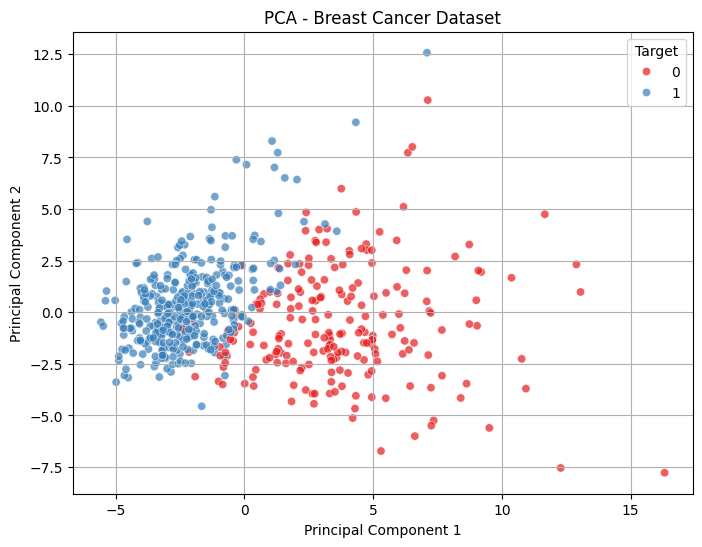

In [7]:
# Plot of PCA-transformed Breast Cancer data
plt.figure(figsize=(8, 6))
sn.scatterplot(x=X_bc_pca[:, 0], y=X_bc_pca[:, 1], hue=y_bc, palette='Set1', alpha=0.7)
plt.title('PCA - Breast Cancer Dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Target')
plt.grid(True)
plt.show()


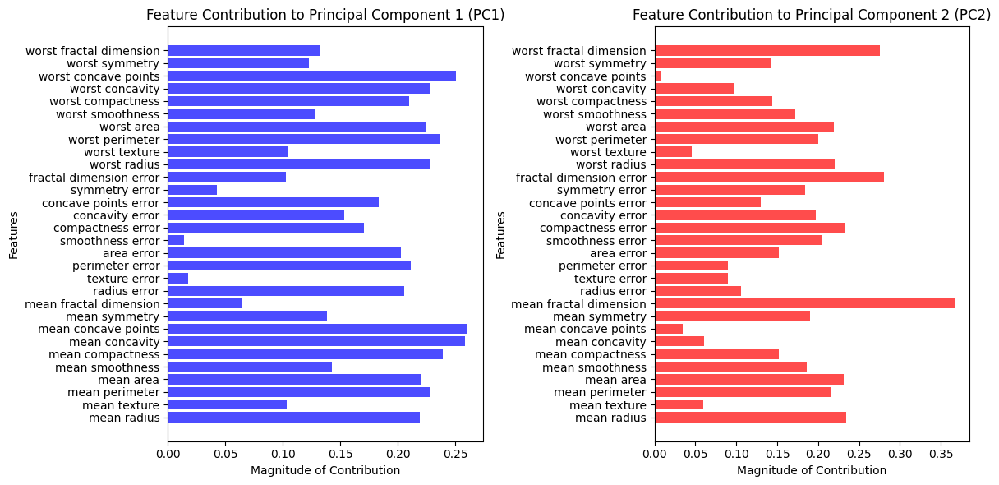

In [8]:
plt.figure(figsize=(12, 6))

# Plot of the contribution of each feature to Principal Component 1 (PC1)
plt.subplot(1, 2, 1)
plt.barh(features_bc, np.abs(pca_bc.components_[0]), alpha=0.7, color='b')
plt.title('Feature Contribution to Principal Component 1 (PC1)')
plt.xlabel('Magnitude of Contribution')
plt.ylabel('Features')

# Plot of the contribution of each feature to Principal Component 2 (PC2)
plt.subplot(1, 2, 2)
plt.barh(features_bc, np.abs(pca_bc.components_[1]), alpha=0.7, color='r')
plt.title('Feature Contribution to Principal Component 2 (PC2)')
plt.xlabel('Magnitude of Contribution')
plt.ylabel('Features')

plt.tight_layout()
plt.show()


#### PCA on the Fruit Dataset



In [9]:
from sklearn.preprocessing import StandardScaler

# Scaling the fruit dataset
scaler_fruit = StandardScaler()
X_fruit_scaled = scaler_fruit.fit_transform(X_fruit)

# PCA on Fruit Dataset 
pca_fruit = PCA(n_components=2)
X_fruit_pca = pca_fruit.fit_transform(X_fruit_scaled)


# Printing the two principal components
print("Principal Component 1 (PC1):")
print(pca_fruit.components_[0])

print("\nPrincipal Component 2 (PC2):")
print(pca_fruit.components_[1])

Principal Component 1 (PC1):
[ 0.6264132   0.57799922  0.49626726 -0.16505215]

Principal Component 2 (PC2):
[ 0.19538115  0.25480203 -0.23856702  0.91650854]


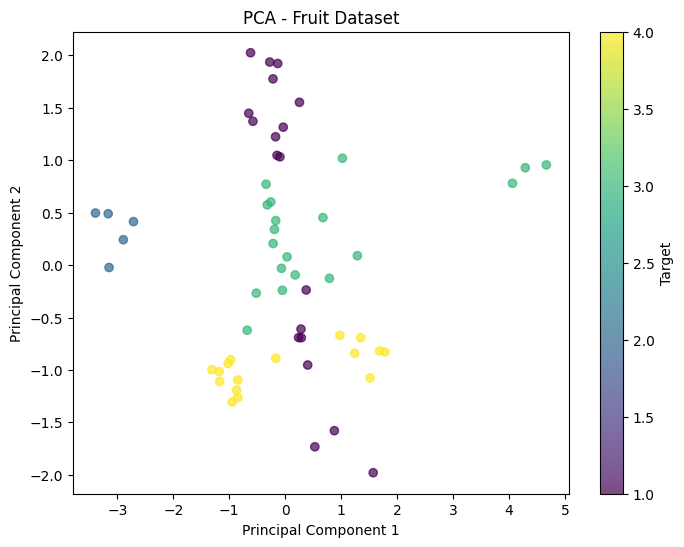

In [10]:
# Plot of PCA-transformed Fruit data
plt.figure(figsize=(8, 6))
plt.scatter(X_fruit_pca[:, 0], X_fruit_pca[:, 1], c=y_fruit, cmap='viridis', alpha=0.7)
plt.colorbar(label='Target')
plt.title('PCA - Fruit Dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

#### Manifold learning methods

#####  Multidimensional scaling (MDS) on the Fruit dataset



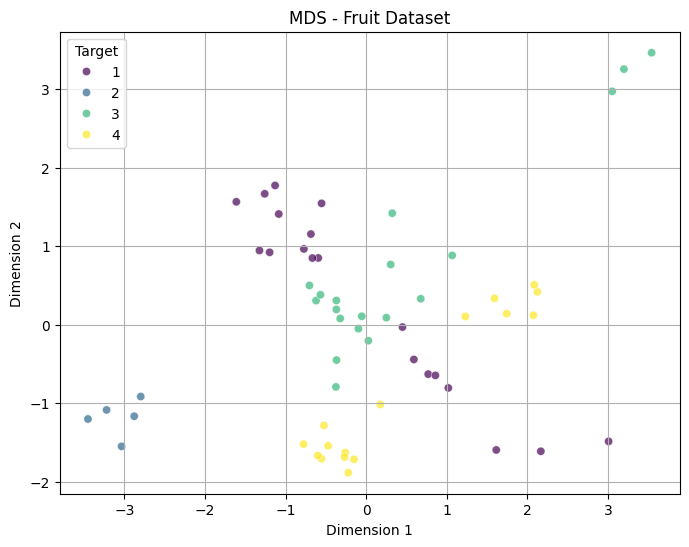

In [11]:
import seaborn as sns

# MDS on Fruit Dataset
mds_fruit = MDS(n_components=2, random_state=42)
X_fruit_mds = mds_fruit.fit_transform(X_fruit_scaled)

# Plot of MDS-transformed Fruit data using seaborn
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=X_fruit_mds[:, 0], 
    y=X_fruit_mds[:, 1], 
    hue=y_fruit, 
    palette='viridis', 
    alpha=0.7
)
plt.title('MDS - Fruit Dataset')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.grid(True)
plt.legend(title='Target')
plt.show()

##### Multidimensional scaling (MDS) on the Breast Cancer dataset



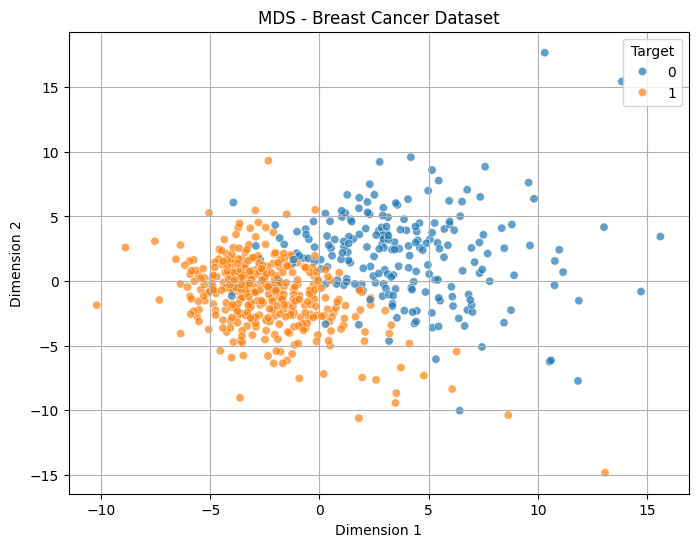

In [12]:
# MDS on Breast Cancer Dataset
mds_bc = MDS(n_components=2, random_state=42)
X_bc_mds = mds_bc.fit_transform(X_bc_scaled)

# Plot of MDS-transformed Breast Cancer data using seaborn
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=X_bc_mds[:, 0], 
    y=X_bc_mds[:, 1], 
    hue=y_bc,  
    alpha=0.7
)
plt.title('MDS - Breast Cancer Dataset')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.grid(True)
plt.legend(title='Target')
plt.show()

##### t-SNE on the Fruit Dataset

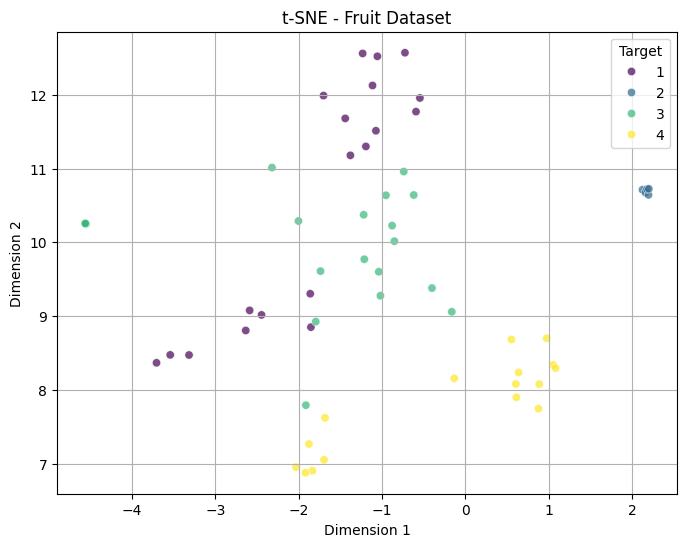

In [13]:
from sklearn.manifold import TSNE
import seaborn as sns

# t-SNE on Fruit Dataset
tsne_fruit = TSNE(n_components=2, init='pca', random_state=42)
X_fruit_tsne = tsne_fruit.fit_transform(X_fruit_scaled)

# Plot of t-SNE-transformed Fruit data using seaborn
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=X_fruit_tsne[:, 0], 
    y=X_fruit_tsne[:, 1], 
    hue=y_fruit, 
    palette='viridis', 
    alpha=0.7
)
plt.title('t-SNE - Fruit Dataset')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.grid(True)
plt.legend(title='Target')
plt.show()

##### t-SNE on the Breast Cancer dataset



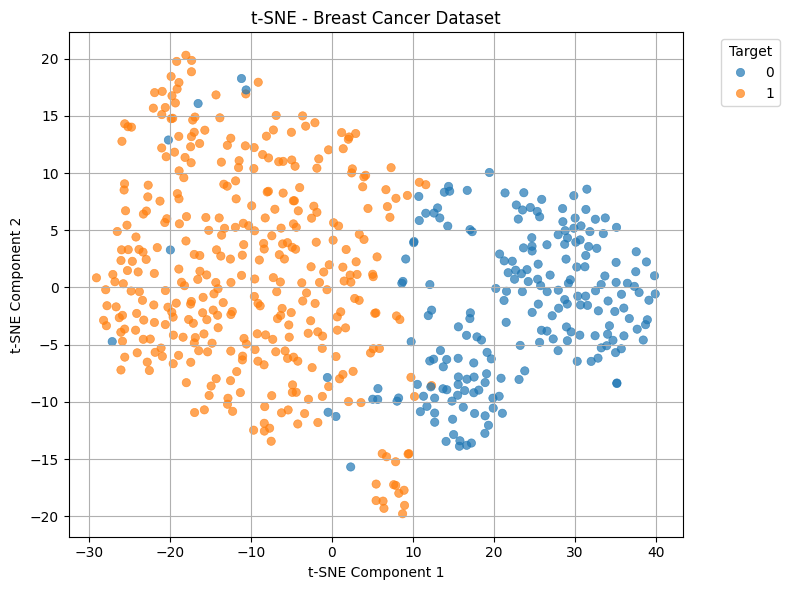

In [14]:
# t-SNE on Breast Cancer Dataset
tsne_bc = TSNE(n_components=2, init='pca', random_state=42)
X_bc_tsne = tsne_bc.fit_transform(X_bc_scaled)

# Plot of t-SNE-transformed Breast Cancer data using seaborn
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=X_bc_tsne[:, 0],
    y=X_bc_tsne[:, 1],
    hue=y_bc,
    alpha=0.7,
    edgecolor=None
)
plt.title('t-SNE - Breast Cancer Dataset')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.grid(True)
plt.legend(title='Target', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


## **Part 2 : Graph Analysis**

##  Zachary's Karate Club


`networkx`.

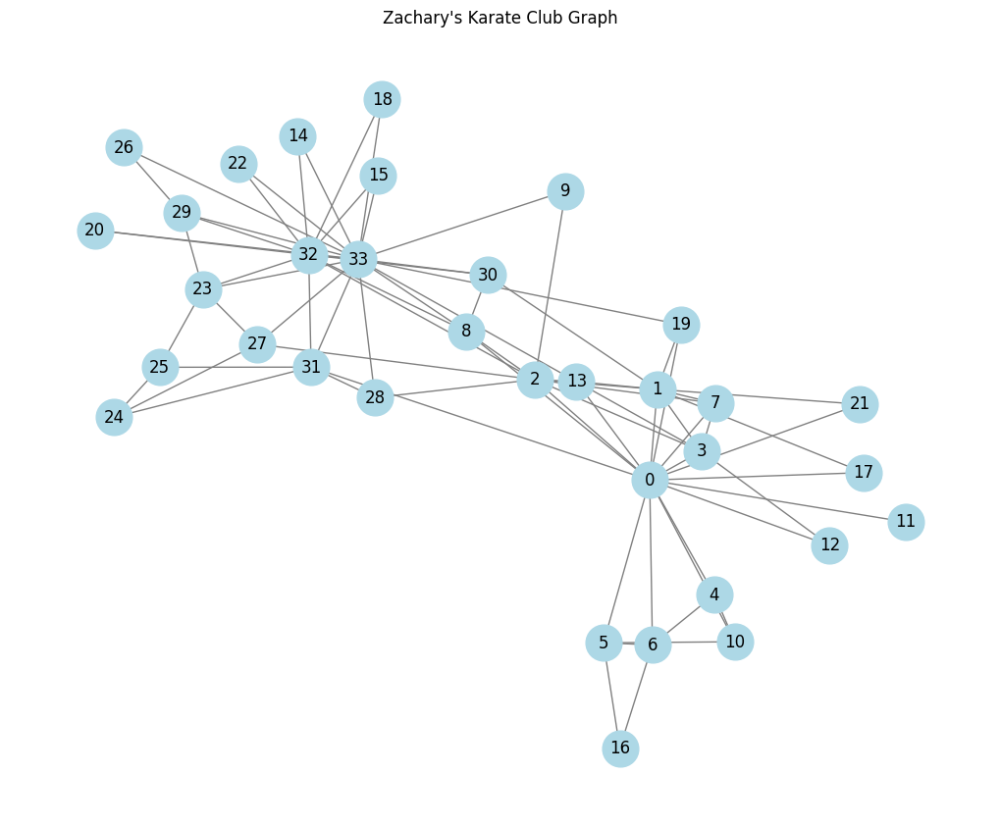

In [15]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
import networkx as nx
import matplotlib.pyplot as plt

G = nx.karate_club_graph()

# Drawing the graph
plt.figure(figsize=(10, 8))
nx.draw(G, with_labels=True, node_color='lightblue', edge_color='gray', node_size=700)
plt.title("Zachary's Karate Club Graph")
plt.show()

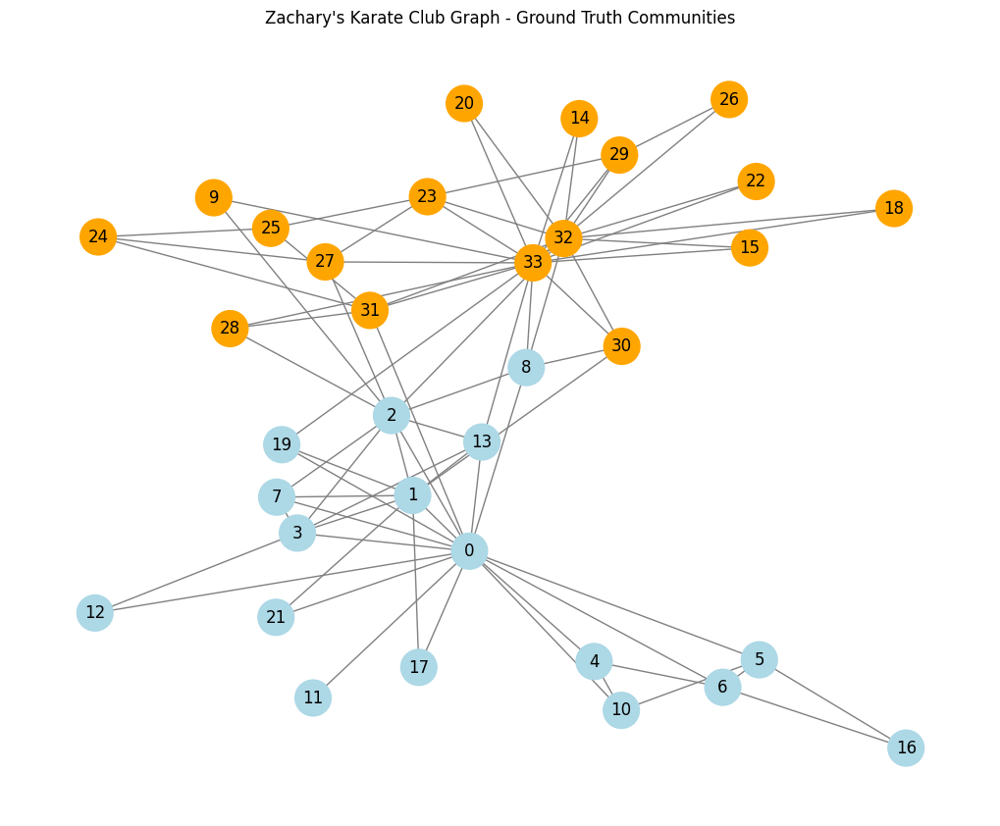

In [16]:
# Assigning colors based on ground truth communities ('Mr. Hi' or 'Officer')
node_colors = []
for node in G.nodes:
    if G.nodes[node]['club'] == 'Mr. Hi':
        node_colors.append('lightblue')
    else:
        node_colors.append('orange')

plt.figure(figsize=(10, 8))
nx.draw(
    G,
    with_labels=True,
    node_color=node_colors,
    edge_color='gray',
    node_size=700
)
plt.title("Zachary's Karate Club Graph - Ground Truth Communities")
plt.show()


## 1. Agglomerative Method: Hierarchical Clustering


### Hierarchichal Clustering

In [17]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import squareform
from sklearn.metrics import accuracy_score

# Computing shortest path distances between all pairs of nodes
distance_matrix = np.zeros((len(G.nodes), len(G.nodes)))
for i, node_i in enumerate(G.nodes):
    for j, node_j in enumerate(G.nodes):
        if i != j:
            distance_matrix[i, j] = nx.shortest_path_length(G, source=node_i, target=node_j)

# Converting to a condensed distance matrix for hierarchical clustering
dist_array = squareform(distance_matrix)

# Hierarchical clustering using average linkage
linkage_matrix = linkage(dist_array, method='average')

In [18]:
# Here is the implementation using AgglomerativeClustering function:

# Computing the distance matrix (using adjacency matrix as a proxy for distance)
# In this matrix, the elements represent the presence (or absence) of edges between nodes. 
# If two nodes are connected, the matrix entry will typically be 1, otherwise 0. 

# This adjacency matrix serves as a distance matrix for hierarchical clustering. 
# In this case, the distance between connected nodes is treated as 0 (high similarity), 
# and the distance between unconnected nodes is treated as 1 (low similarity).

# D = nx.to_numpy_array(G)


# Hierarchical Clustering

# The distance between two clusters is defined as the average distance between all pairs of nodes, where one node is in each cluster

# clustering = AgglomerativeClustering(n_clusters=2, linkage='average')

# The distance between two nodes will be 0 if they are connected (similar) and 1 if they are not (dissimilar)
# We fit the agglomerative clustering model on the provided distance matrix and it returns the cluster labels for each node.

# labels = clustering.fit_predict(1 - D)  # Invert adjacency to use as distances

# Drawing the graph with cluster labels
# plt.figure(figsize=(10, 8))
# color_map = ['red' if label == 0 else 'blue' for label in labels]
# nx.draw(G, with_labels=True, node_color=color_map, edge_color='gray', node_size=700)
# plt.title("Zachary's Karate Club Graph with Cluster Labels")
# plt.show()


### Visualization 

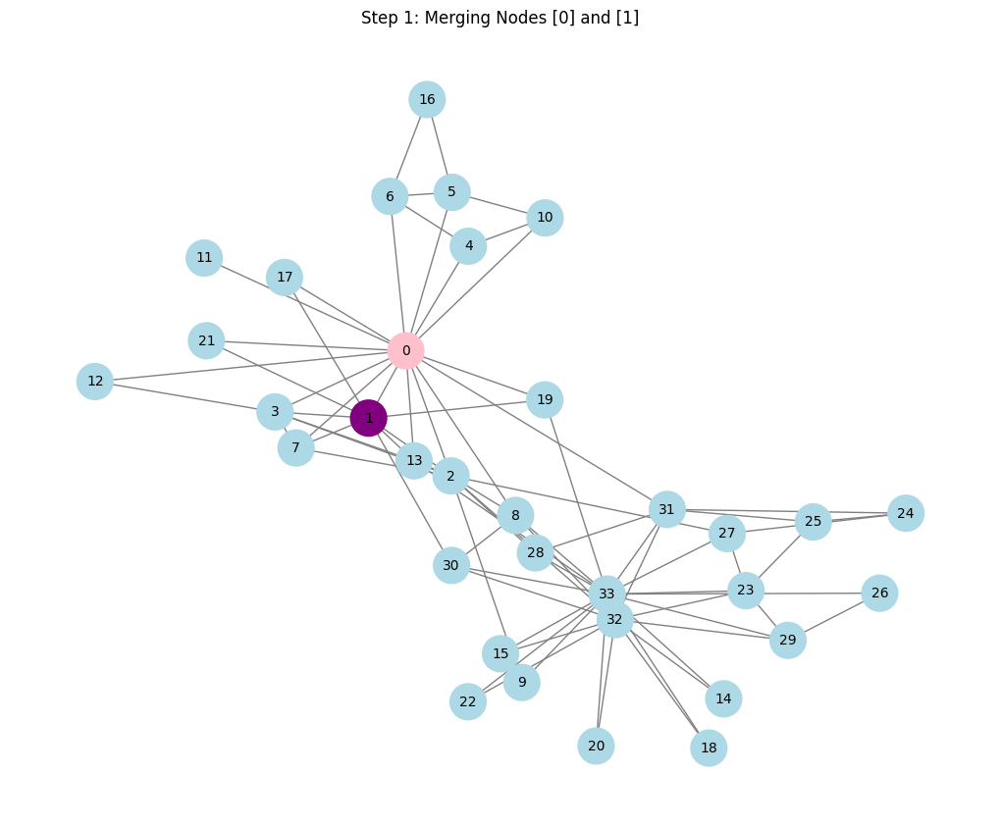

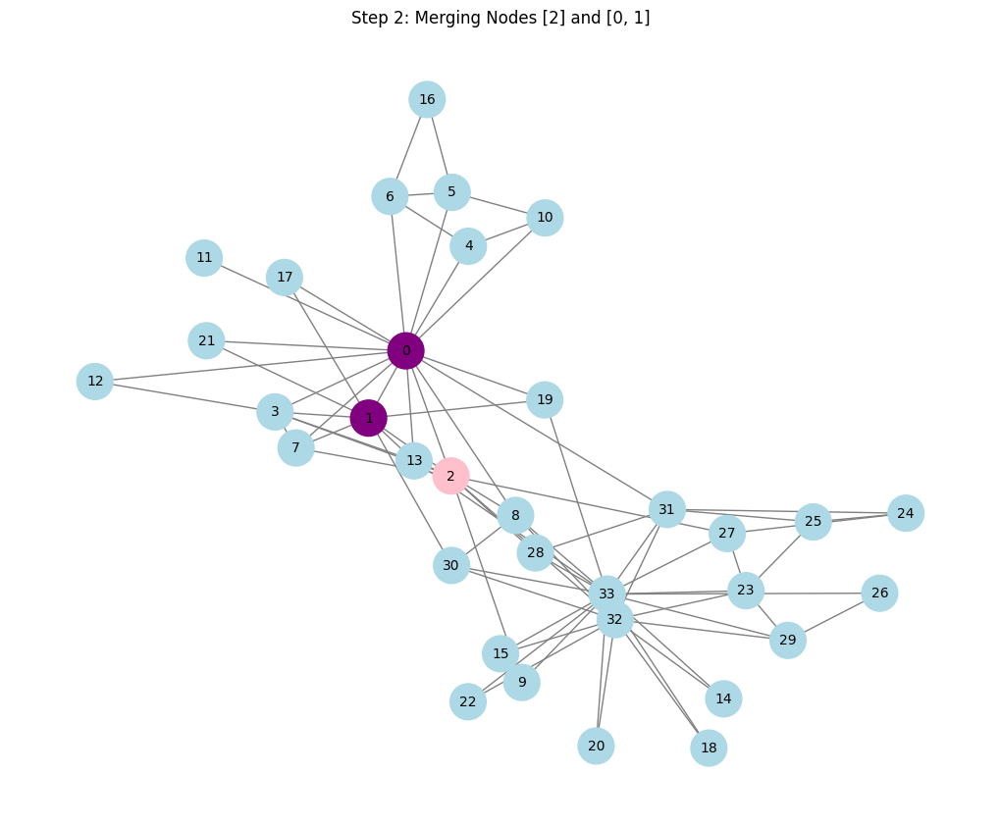

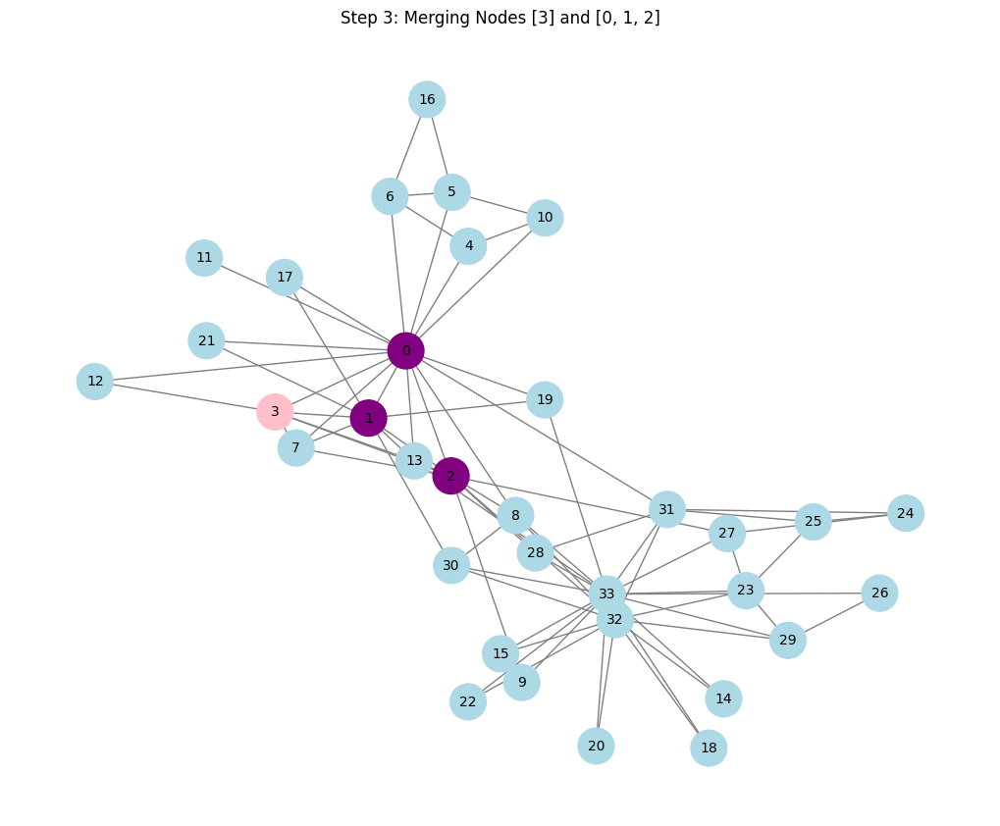

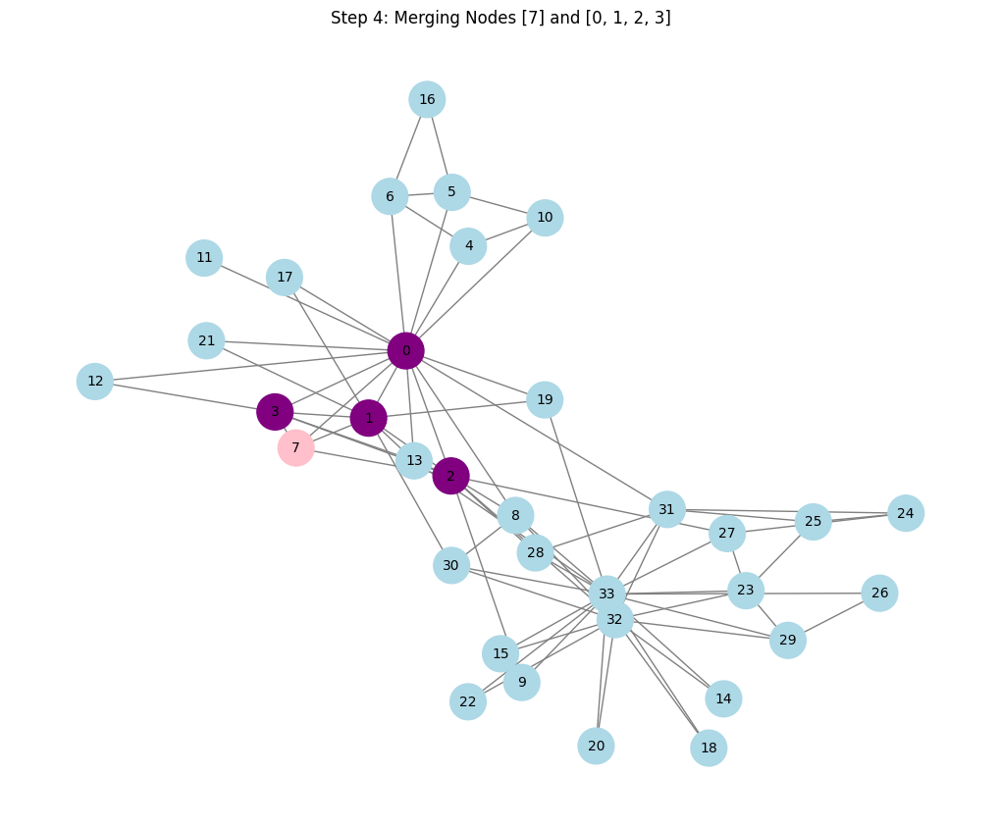

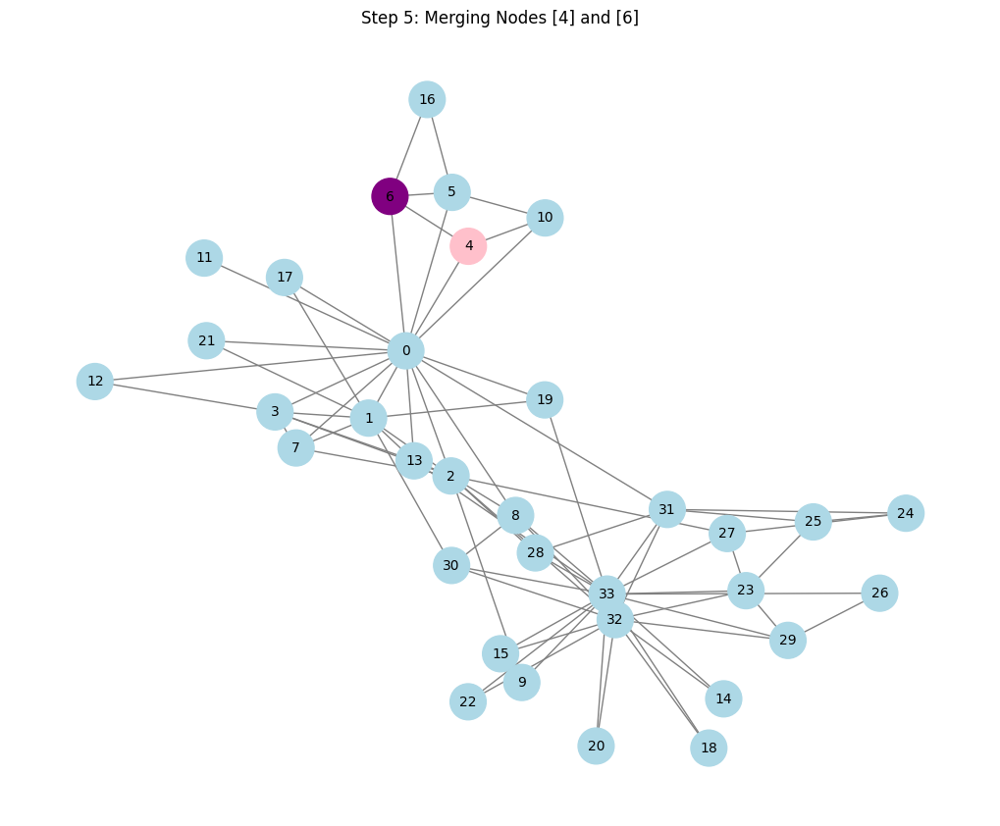

...

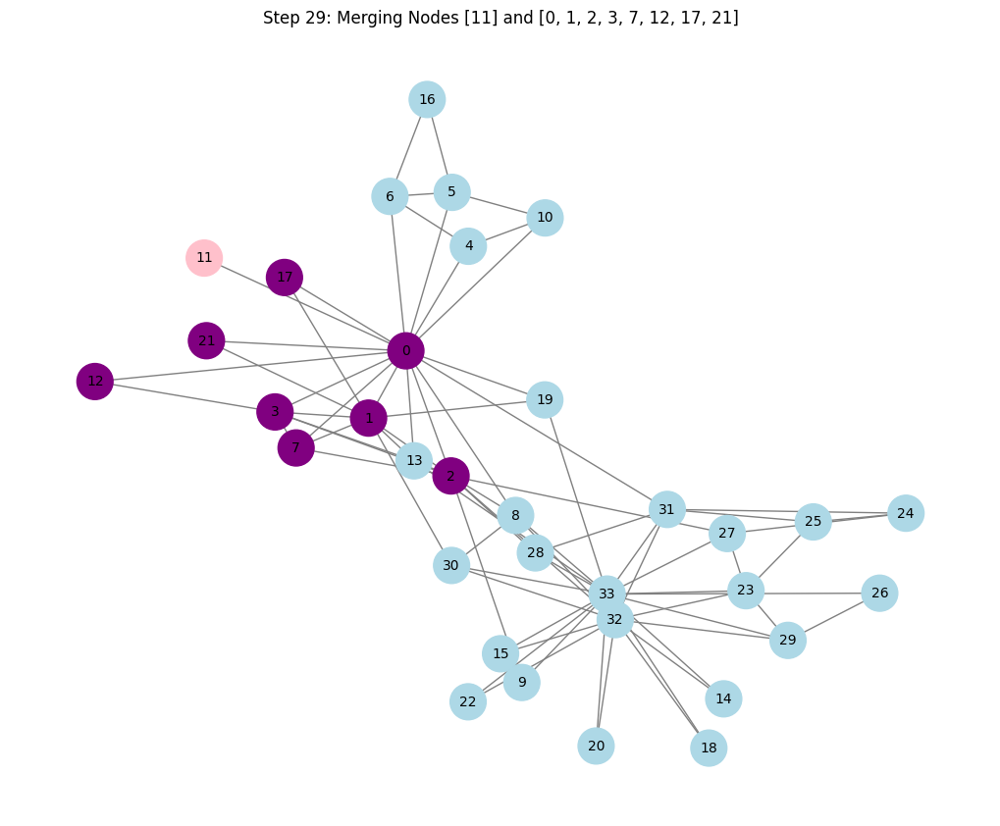

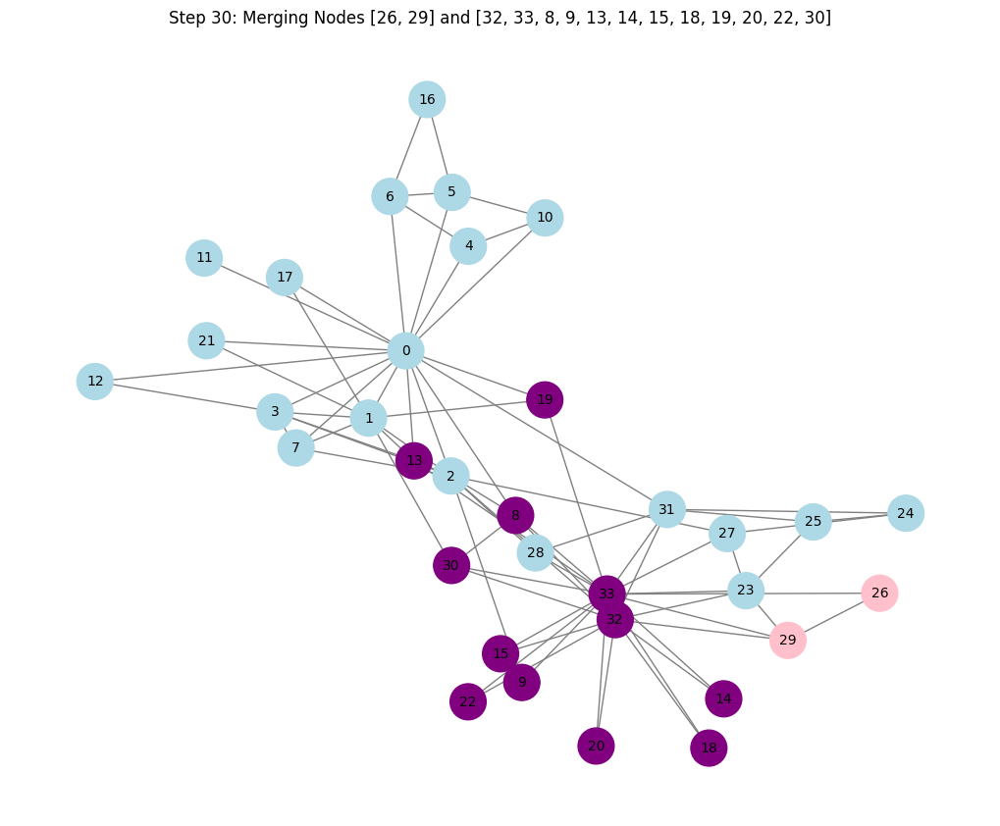

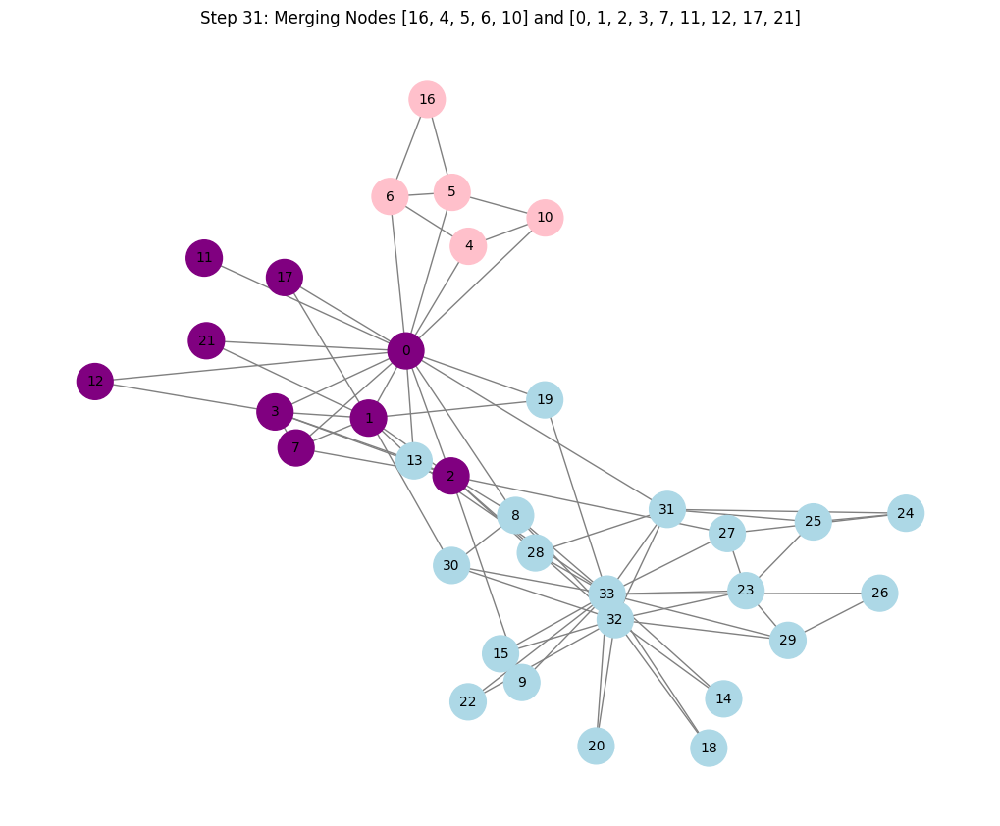

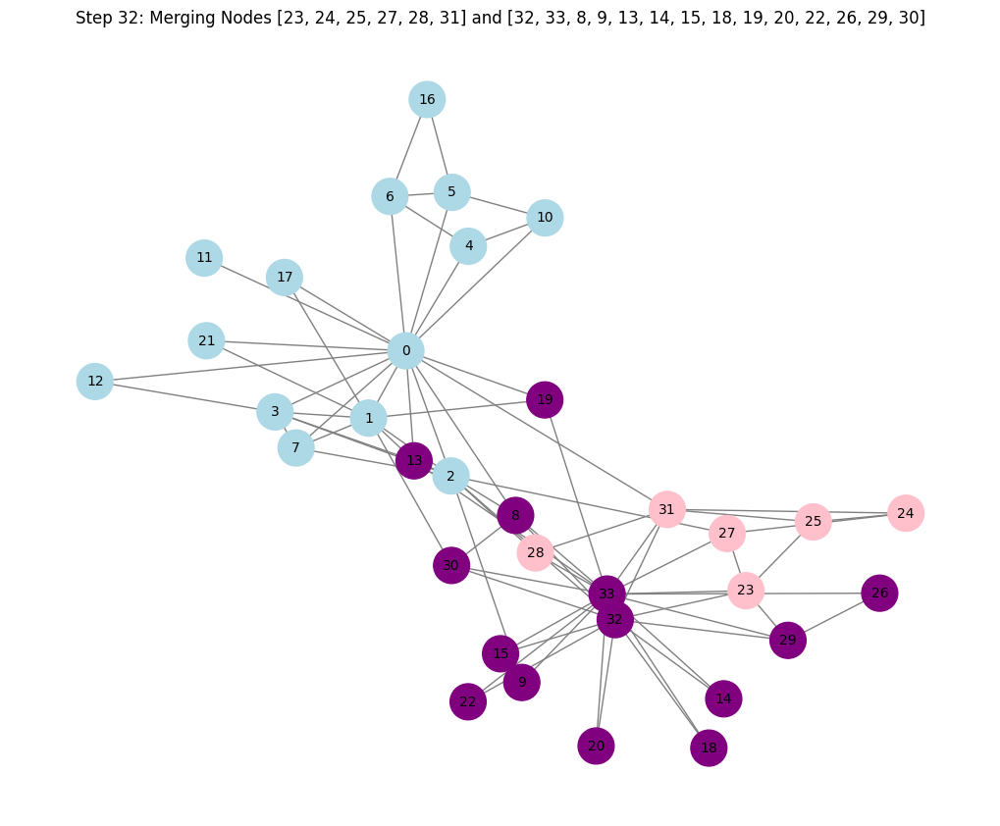

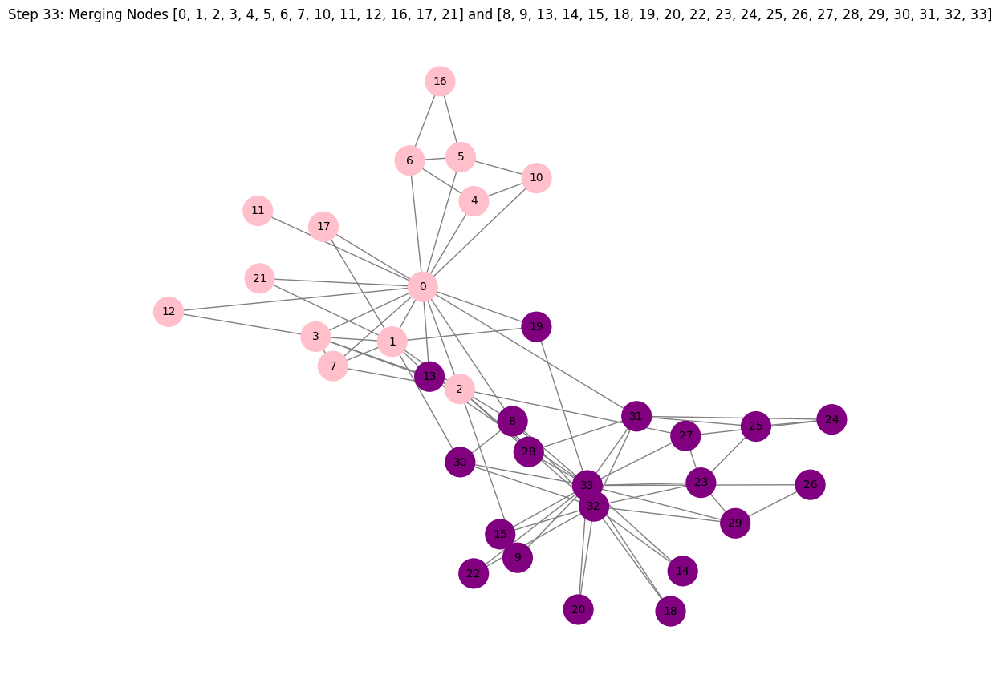

In [19]:
pos = nx.spring_layout(G, seed=42) 
clusters = [{node} for node in list(G.nodes)]  

for step, (i, j, dist, _) in enumerate(linkage_matrix):
    plt.figure(figsize=(10, 8))

    # The clusters being merged
    cluster_i = clusters[int(i)]
    cluster_j = clusters[int(j)]

    node_colors = []
    for node in G.nodes:
        if node in cluster_i:
            node_colors.append('pink')
        elif node in cluster_j:
            node_colors.append('purple')
        else:
            node_colors.append('lightblue')

    nx.draw(G, pos, with_labels=True, node_color=node_colors, edge_color='gray',node_size=700, font_size=10)
    plt.title(f"Step {step + 1}: Merging Nodes {list(cluster_i)} and {list(cluster_j)}")
    plt.show()

    new_cluster = cluster_i.union(cluster_j)
    clusters.append(new_cluster)
    



### Dendrogram


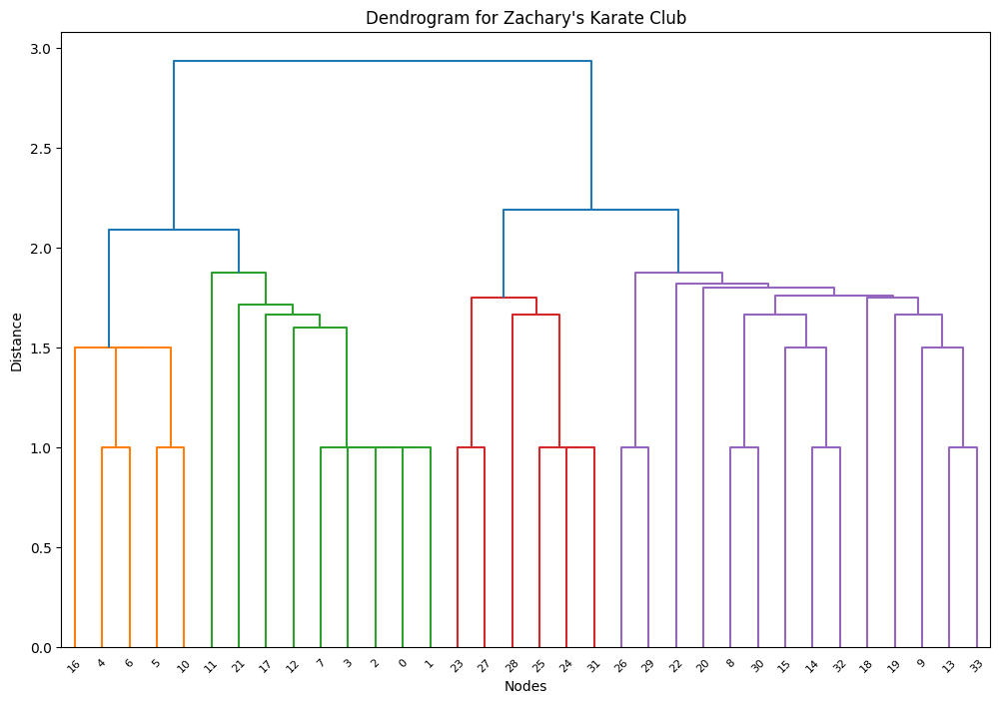

In [20]:
# The linkage matrix contains information about the merges that occur during the hierarchical clustering. 
# Each row in the linkage matrix represents a merge:
# The first two columns indicate the indices of the clusters being merged (before the merge)
# The third column represents the distance between those two clusters at the time of merging.
# The fourth column indicates the size of the resulting merged cluster.

# Plot of the dendrogram
plt.figure(figsize=(12, 8))
dendrogram(linkage_matrix, labels=range(len(G.nodes)))
plt.title("Dendrogram for Zachary's Karate Club")
plt.xlabel("Nodes")
plt.ylabel("Distance")
plt.show()

## 2. Modularity-Based Community Detection: The Louvain Method

### Best Partitions



In [21]:
%pip install python-louvain

Note: you may need to restart the kernel to use updated packages.


In [22]:
from community import community_louvain 

G = nx.karate_club_graph()

partition = community_louvain.best_partition(G)

# Printing the partitions (node-to-community mapping)
print("Best Partitions:", partition)


Best Partitions: {0: 0, 1: 0, 2: 0, 3: 0, 4: 2, 5: 2, 6: 2, 7: 0, 8: 3, 9: 3, 10: 2, 11: 0, 12: 0, 13: 0, 14: 3, 15: 3, 16: 2, 17: 0, 18: 3, 19: 0, 20: 3, 21: 0, 22: 3, 23: 3, 24: 1, 25: 1, 26: 3, 27: 3, 28: 1, 29: 3, 30: 3, 31: 1, 32: 3, 33: 3}


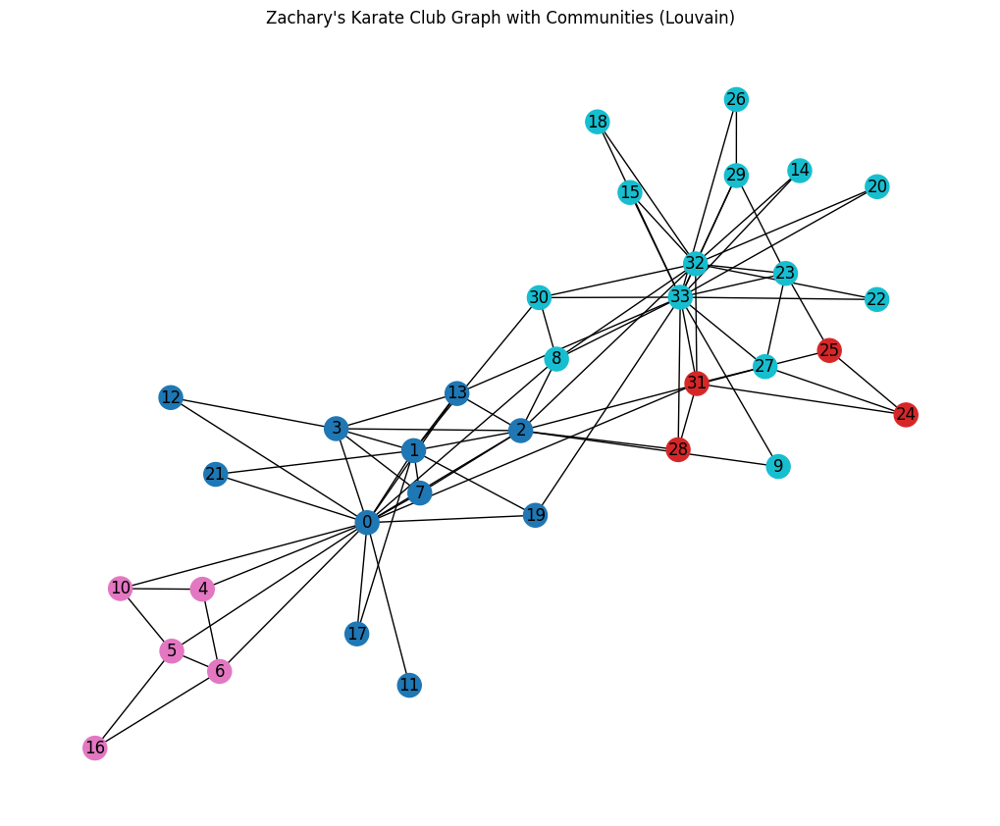

In [23]:
# Generating colors for each community
colors = [partition[node] for node in G.nodes]

# Drawing the graph with community colors
plt.figure(figsize=(10, 8))
nx.draw(G, node_color=colors, with_labels=True, cmap=plt.cm.tab10, node_size=300)
plt.title("Zachary's Karate Club Graph with Communities (Louvain)")
plt.show()


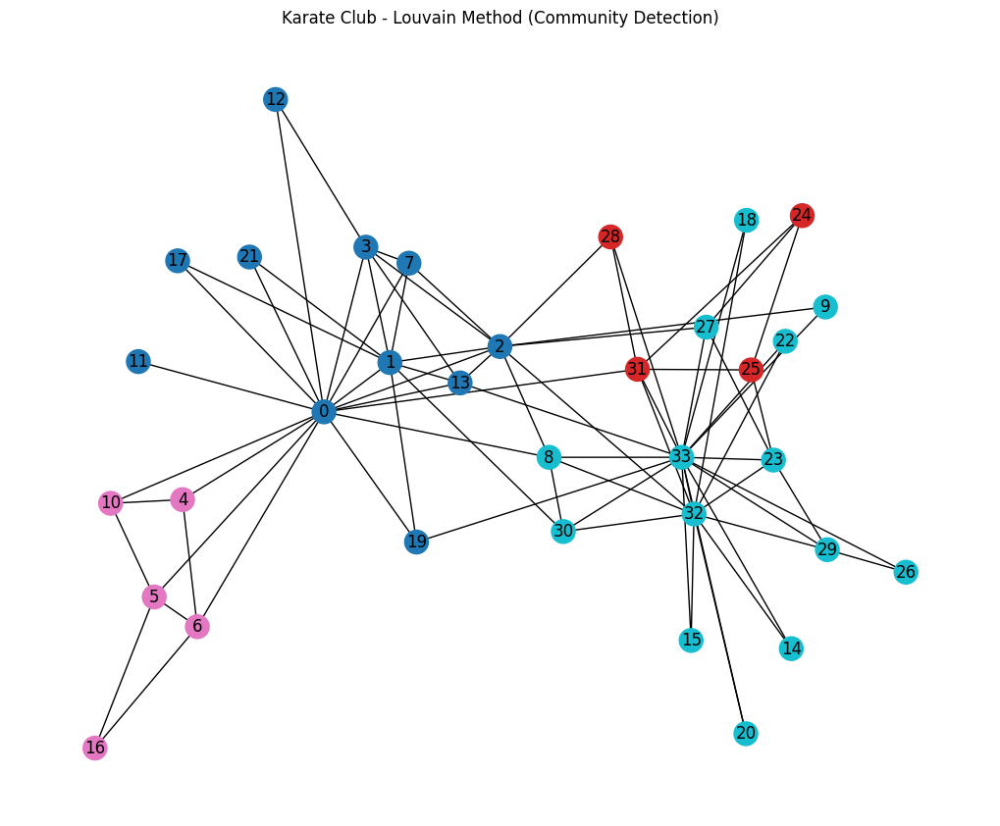

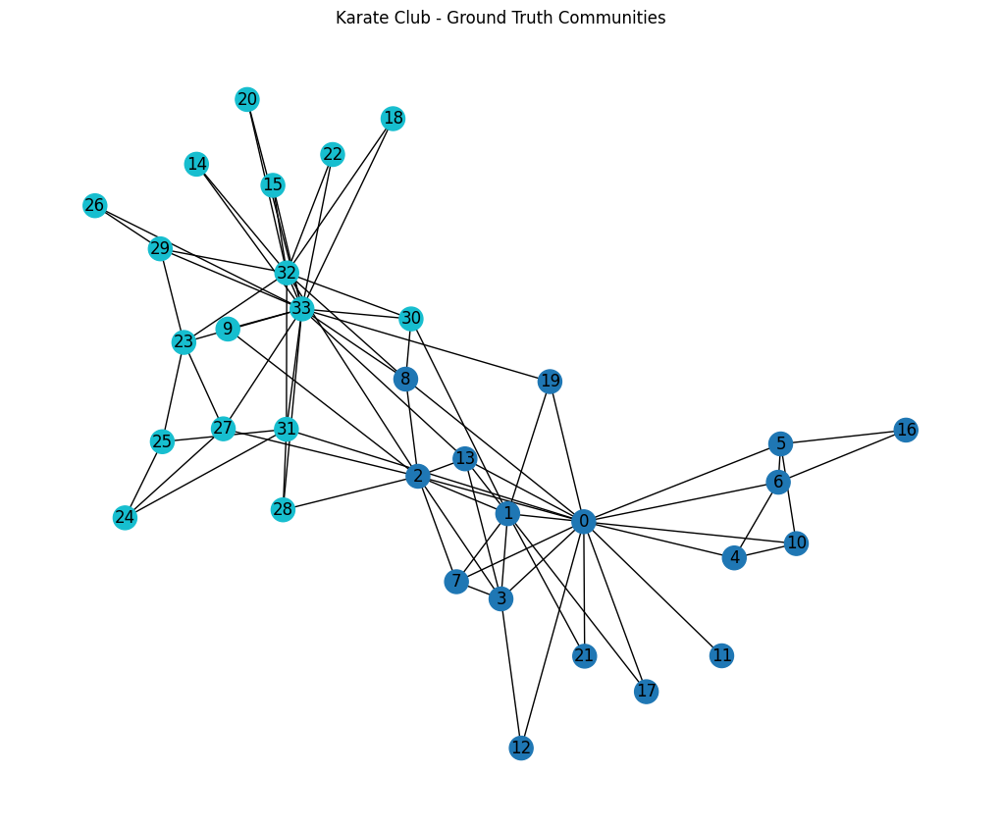

Louvain Partition: {0: 0, 1: 0, 2: 0, 3: 0, 4: 2, 5: 2, 6: 2, 7: 0, 8: 3, 9: 3, 10: 2, 11: 0, 12: 0, 13: 0, 14: 3, 15: 3, 16: 2, 17: 0, 18: 3, 19: 0, 20: 3, 21: 0, 22: 3, 23: 3, 24: 1, 25: 1, 26: 3, 27: 3, 28: 1, 29: 3, 30: 3, 31: 1, 32: 3, 33: 3}
Ground Truth Partition: {0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 1, 10: 0, 11: 0, 12: 0, 13: 0, 14: 1, 15: 1, 16: 0, 17: 0, 18: 1, 19: 0, 20: 1, 21: 0, 22: 1, 23: 1, 24: 1, 25: 1, 26: 1, 27: 1, 28: 1, 29: 1, 30: 1, 31: 1, 32: 1, 33: 1}
Accuracy of Louvain algorithm: 44.12%


In [26]:
plt.figure(figsize=(10, 8))
colors = [partition[node] for node in G.nodes()]
nx.draw(G, node_color=colors, with_labels=True, cmap=plt.cm.tab10, node_size=300)
plt.title("Karate Club - Louvain Method (Community Detection)")
plt.show()


# Comparing Louvain partition with ground truth
actual_labels = nx.get_node_attributes(G, 'club')
ground_truth = {node: 0 if club == 'Mr. Hi' else 1 for node, club in actual_labels.items()}

plt.figure(figsize=(10, 8))
ground_truth_colors = [ground_truth[node] for node in G.nodes()]
nx.draw(G, node_color=ground_truth_colors, with_labels=True, cmap=plt.cm.tab10, node_size=300)
plt.title("Karate Club - Ground Truth Communities")
plt.show()

# Comparison
print("Louvain Partition:", partition)
print("Ground Truth Partition:", ground_truth)


louvain_groups = {key: val for key, val in sorted(partition.items())}
actual_groups = {key: val for key, val in sorted(ground_truth.items())}

correctly_classified = sum([1 for node in G.nodes if partition[node] == ground_truth[node]])
accuracy = correctly_classified / len(G.nodes)
print(f"Accuracy of Louvain algorithm: {accuracy * 100:.2f}%")



## 3. Girvan-Newman clustering


In [25]:
%%capture
%pip install networkx python-louvain matplotlib

### Seeing the graph nodes


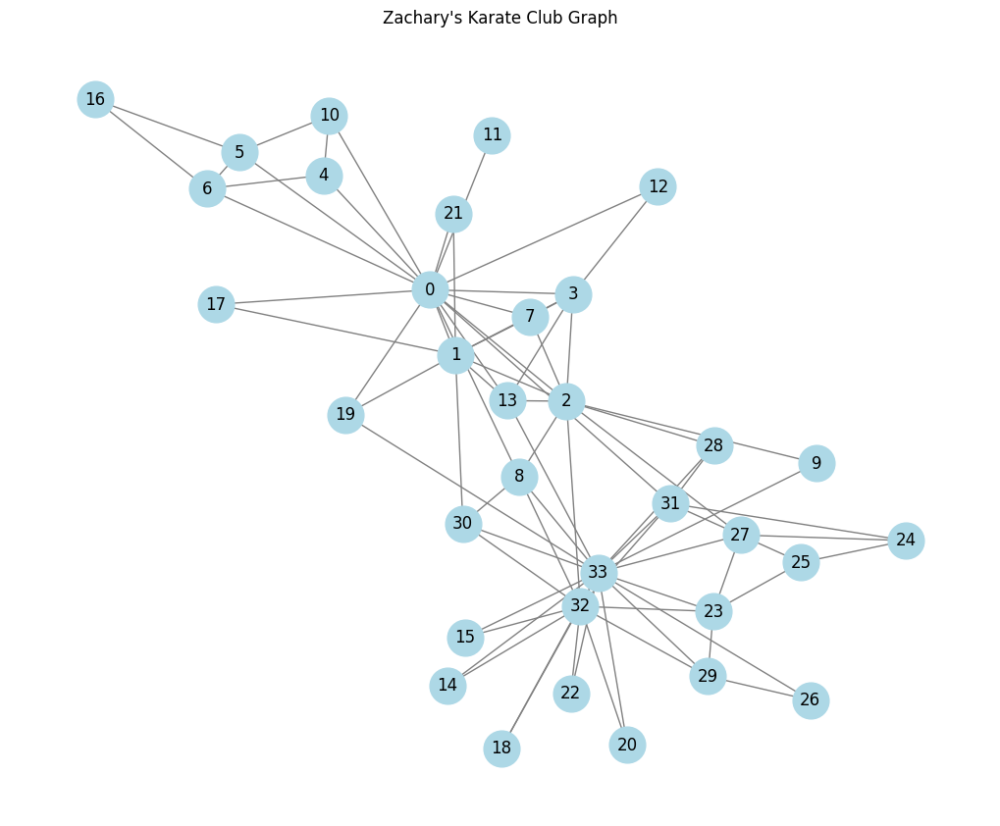

Graph Nodes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33]


In [27]:
K = nx.karate_club_graph()
plt.figure(figsize=(10, 8))
nx.draw(K, with_labels=True, node_color="lightblue", node_size=700, edge_color="gray")
plt.title("Zachary's Karate Club Graph")
plt.show()

# Displaying the graph nodes
print("Graph Nodes:", K.nodes)


### 3.1 Create a partition sequence
#### A. Betweenness Centrality

In [28]:
edge_betweenness = nx.edge_betweenness_centrality(K)

In [29]:
betweenness_0_1 = edge_betweenness[(0, 1)]

print(f"Betweenness centrality of the edge between node 0 and 1: {betweenness_0_1:.4f}")

Betweenness centrality of the edge between node 0 and 1: 0.0253


In [30]:
print("Edge Betweenness Centrality:")
for edge, value in edge_betweenness.items():
    print(f"Edge {edge}: {value}")

Edge Betweenness Centrality:
Edge (0, 1): 0.025252525252525245
Edge (0, 2): 0.0777876807288572
Edge (0, 3): 0.02049910873440285
Edge (0, 4): 0.0522875816993464
Edge (0, 5): 0.07813428401663694
Edge (0, 6): 0.07813428401663695
Edge (0, 7): 0.0228206434088787
Edge (0, 8): 0.07423959482783014
Edge (0, 10): 0.0522875816993464
Edge (0, 11): 0.058823529411764705
Edge (0, 12): 0.04652406417112298
Edge (0, 13): 0.04237189825425121
Edge (0, 17): 0.04012392835922248
Edge (0, 19): 0.045936960642843
Edge (0, 21): 0.040123928359222474
Edge (0, 31): 0.1272599949070537
Edge (1, 2): 0.023232323232323233
Edge (1, 3): 0.0077243018419489
Edge (1, 7): 0.007422969187675069
Edge (1, 13): 0.01240556828792123
Edge (1, 17): 0.01869960105254222
Edge (1, 19): 0.014633732280791102
Edge (1, 21): 0.01869960105254222
Edge (1, 30): 0.032280791104320514
Edge (2, 3): 0.022430184194890075
Edge (2, 7): 0.025214328155504617
Edge (2, 8): 0.009175791528732704
Edge (2, 9): 0.030803836686189627
Edge (2, 13): 0.007630931160342

#### B. Remove the link with largest betweenness

In [31]:
edge_to_remove = max(edge_betweenness, key=edge_betweenness.get)
print(f"Edge with the highest betweenness: {edge_to_remove}")

Edge with the highest betweenness: (0, 31)


####  C. Recalculate the betweenness centrality of the links of the resulting graph, & D. Repeat from step B until no links remain

In [32]:
K.remove_edge(*edge_to_remove)
partition_sequence = []
G = K.copy()

# Loop until no edges remain
while G.number_of_edges() > 0:
    
    components = list(nx.connected_components(G))
    partition_sequence.append(components)

    edge_betweenness = nx.edge_betweenness_centrality(G)

    edge_to_remove = max(edge_betweenness, key=edge_betweenness.get)
    G.remove_edge(*edge_to_remove)


### Evaluate the modularity of each partition in the sequence


In [33]:
from networkx.algorithms.community import modularity

def calculate_modularity(graph, partition):
    return modularity(graph, partition)

# Evaluating modularity for each partition
modularities = [calculate_modularity(K, p) for p in partition_sequence]

for i, modularity in enumerate(modularities):
    print(f"Partition {i + 1}: Modularity = {modularity:.4f}")

Partition 1: Modularity = 0.0000
Partition 2: Modularity = 0.0000
Partition 3: Modularity = 0.0000
Partition 4: Modularity = 0.0000
Partition 5: Modularity = 0.0000
Partition 6: Modularity = 0.0000
Partition 7: Modularity = 0.0000
Partition 8: Modularity = 0.0000
Partition 9: Modularity = 0.0000
Partition 10: Modularity = 0.0000
Partition 11: Modularity = 0.3549
Partition 12: Modularity = 0.3549
Partition 13: Modularity = 0.3549
Partition 14: Modularity = 0.3495
Partition 15: Modularity = 0.3495
Partition 16: Modularity = 0.3495
Partition 17: Modularity = 0.3495
Partition 18: Modularity = 0.3650
Partition 19: Modularity = 0.3650
Partition 20: Modularity = 0.3650
Partition 21: Modularity = 0.3650
Partition 22: Modularity = 0.3650
Partition 23: Modularity = 0.3650
Partition 24: Modularity = 0.3902
Partition 25: Modularity = 0.3809
Partition 26: Modularity = 0.3809
Partition 27: Modularity = 0.3645
Partition 28: Modularity = 0.3645
Partition 29: Modularity = 0.3520
Partition 30: Modularit

In [34]:
max_modularity = max(modularities)
best_partition = partition_sequence[modularities.index(max_modularity)]

print("Maximum Modularity:", max_modularity)
print("Best Partition:", best_partition)

Maximum Modularity: 0.39016227760721567
Best Partition: [{0, 1, 3, 7, 11, 12, 13, 17, 19, 21}, {2, 24, 25, 27, 28, 31}, {4, 5, 6, 10, 16}, {32, 33, 8, 14, 15, 18, 20, 22, 23, 26, 29, 30}, {9}]


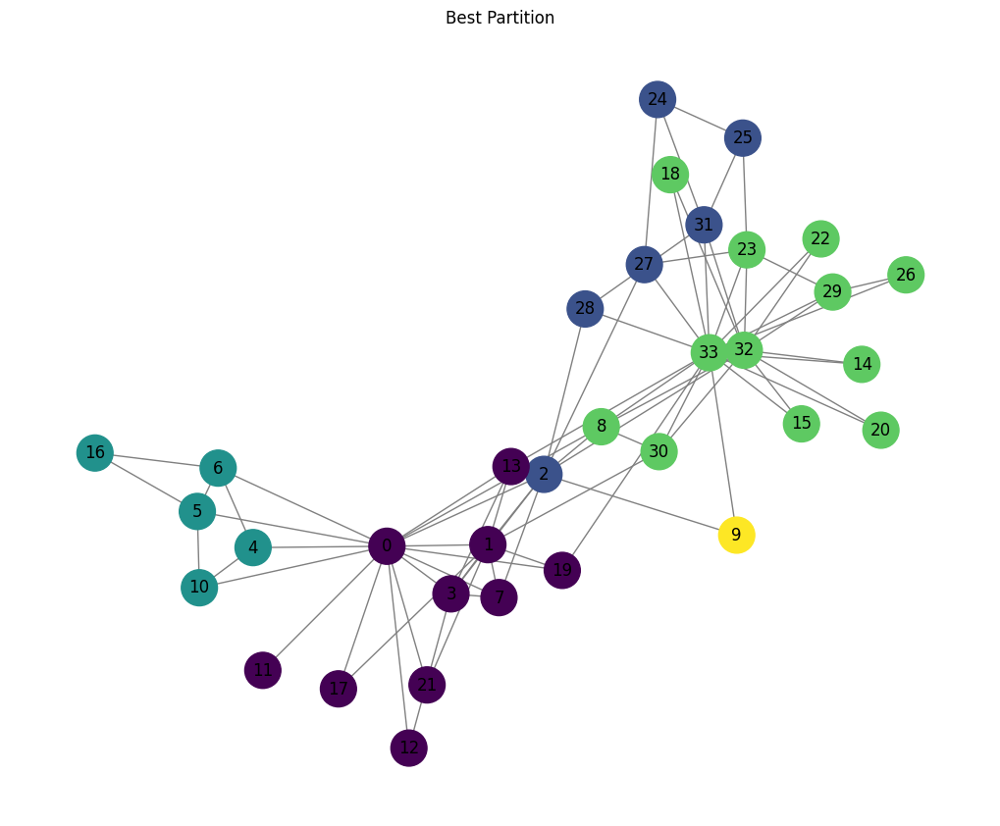

In [35]:
# Assigning community labels to nodes
community_labels = {node: i for i, community in enumerate(best_partition) for node in community}

plt.figure(figsize=(10, 8))
colors = [community_labels[node] for node in K.nodes]
nx.draw(K, with_labels=True, node_color=colors, edge_color='gray', node_size=700, cmap='viridis')
plt.title("Best Partition")
plt.show()

In [36]:
two_community_partition = None
for partition in partition_sequence:
    if len(partition) == 2:
        two_community_partition = partition
        break

print("Partition with two communities:", two_community_partition)

Partition with two communities: [{0, 1, 3, 4, 5, 6, 7, 10, 11, 12, 13, 16, 17, 19, 21}, {2, 8, 9, 14, 15, 18, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33}]


In [37]:
ground_truth_labels = {node: data['club'] for node, data in K.nodes(data=True)}
ground_truth_numeric = {node: (0 if label == 'Mr. Hi' else 1) for node, label in ground_truth_labels.items()}

gn_labels = {node: (i if node in community else None) for i, community in enumerate(two_community_partition) for node in community}

ground_truth = [ground_truth_numeric[node] for node in K.nodes]
gn_result = [gn_labels[node] for node in K.nodes]

print("Ground Truth Labels:", ground_truth)
print("Girvan-Newman Labels:", gn_result)


Ground Truth Labels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Girvan-Newman Labels: [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


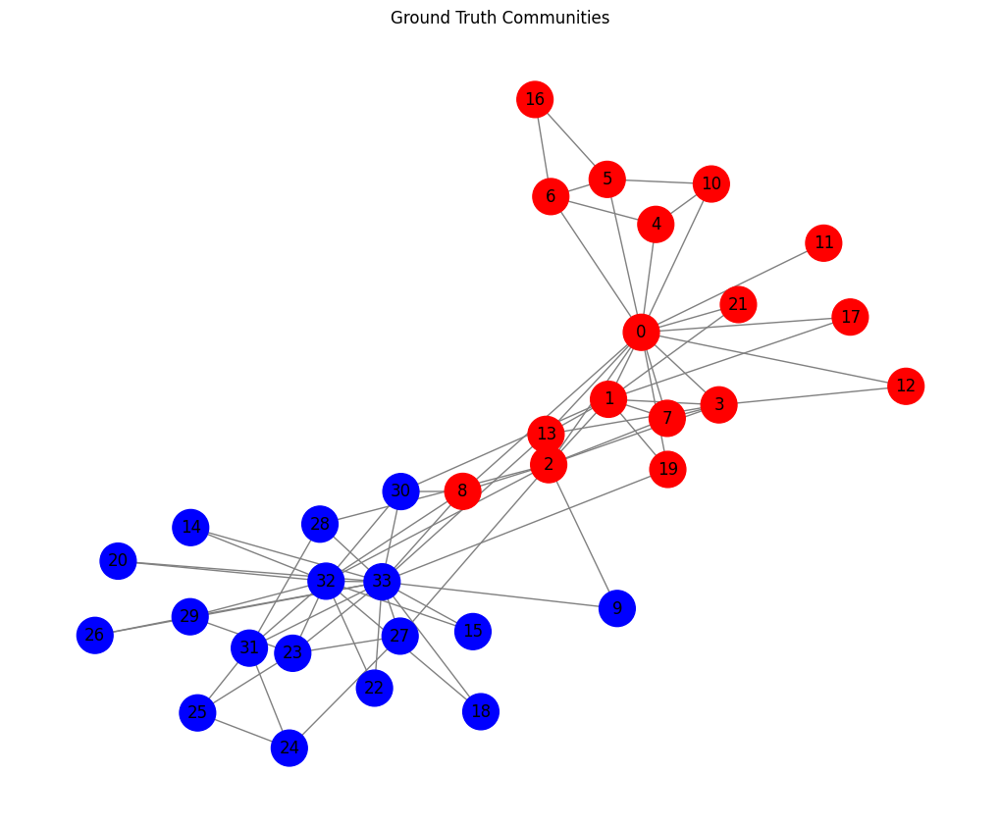

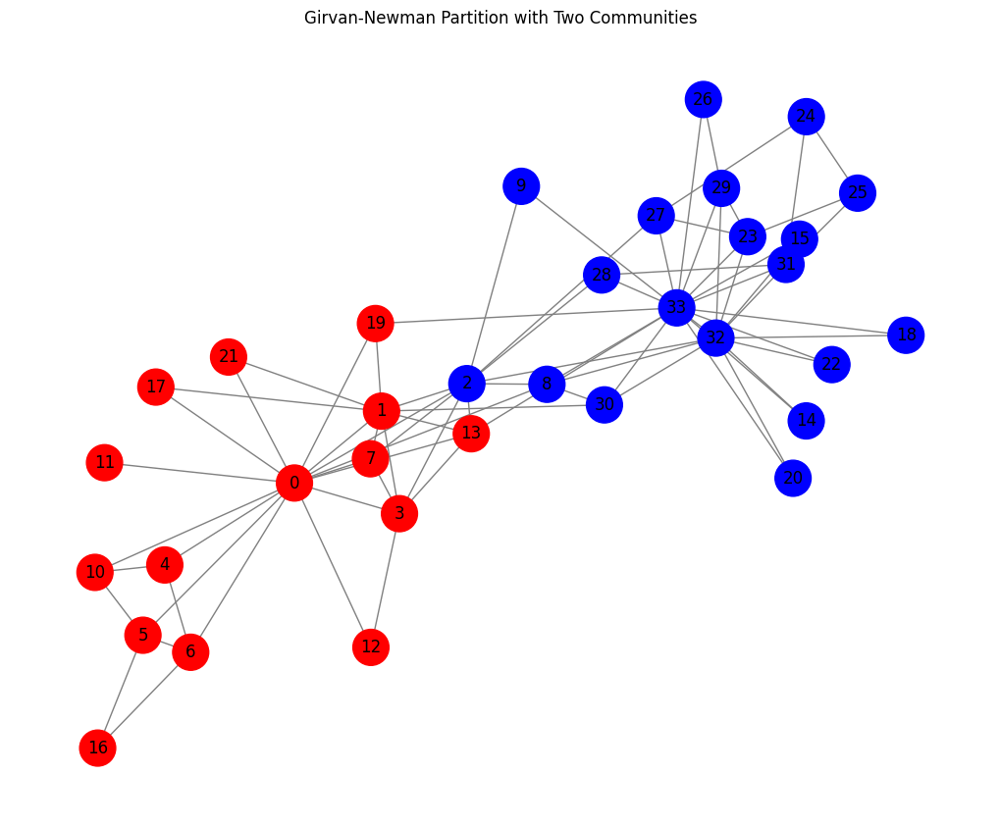

Accuracy: 94.12%


In [38]:
from sklearn.metrics import accuracy_score


plt.figure(figsize=(10, 8))
ground_truth_colors = ['red' if ground_truth_numeric[node] == 0 else 'blue' for node in K.nodes]
nx.draw(K, with_labels=True, node_color=ground_truth_colors, edge_color='gray', node_size=700)
plt.title("Ground Truth Communities")
plt.show()

plt.figure(figsize=(10, 8))
gn_colors = ['red' if gn_labels[node] == 0 else 'blue' for node in K.nodes]
nx.draw(K, with_labels=True, node_color=gn_colors, edge_color='gray', node_size=700)
plt.title("Girvan-Newman Partition with Two Communities")
plt.show()

accuracy = accuracy_score(ground_truth, gn_result) * 100
print(f"Accuracy: {accuracy:.2f}%")


### 4. Marvel Universe Network

In [39]:
%pip install powerlaw
%pip install python-louvain

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import csv
import networkx as nx
import numpy as np
import community
import powerlaw
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import operator
import collections
import sys
from tqdm import tqdm
import random

ModuleNotFoundError: No module named 'community'

#### Read the Dataset

In [52]:
file_path = 'hero-comic-network.csv' 
hero_comic_df = pd.read_csv(file_path)

print(hero_comic_df.head())

        FROST, CARMILLA  AA2 35
0  KILLRAVEN/JONATHAN R  AA2 35
1              M'SHULLA  AA2 35
2  24-HOUR MAN/EMMANUEL  AA2 35
3             OLD SKULL  AA2 35
4                G'RATH  AA2 35


#### Find and plot the community in the Marvel Dataset

#### Create graph


In [53]:
G = nx.Graph()

for index, row in hero_comic_df.iterrows():
    hero = row.iloc[0]   
    comic = row.iloc[1]  
    G.add_edge(hero, comic)

print(G)


Graph with 19291 nodes and 96518 edges


#### Find the partition with community Louvain function



In [54]:
# Partitioning the graph using Louvain algorithm
partition = community_louvain.best_partition(G)

#### Visualize the Network Using NetworkX and save the figure



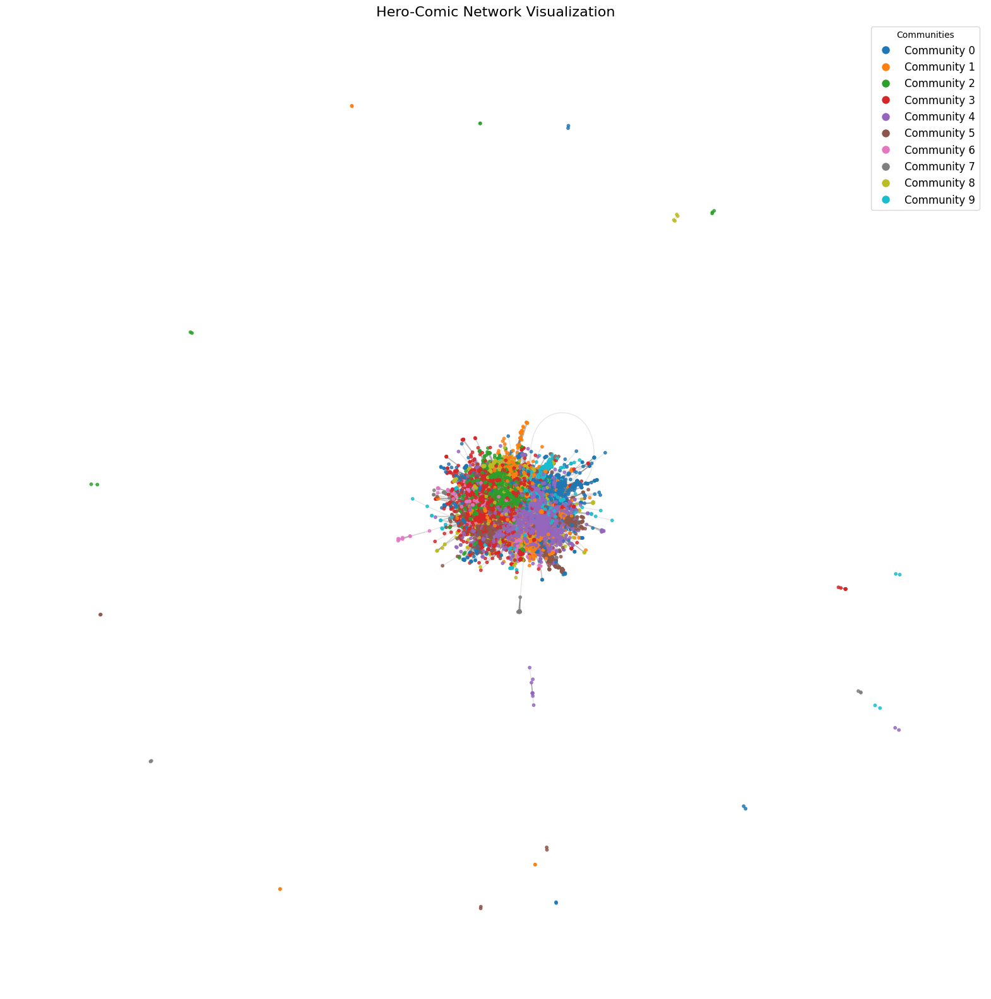

In [55]:
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors


num_communities = max(partition.values()) + 1
colors = list(mcolors.TABLEAU_COLORS.values())[:num_communities]  
node_colors = [colors[partition[node] % len(colors)] for node in G.nodes]

# Node positions
pos = nx.spring_layout(G, seed=42)  

plt.figure(figsize=(20, 20))
nx.draw_networkx_nodes(G, pos, node_size=10, node_color=node_colors, alpha=0.8)
nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.2)

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10) 
           for color in colors]
labels = [f"Community {i}" for i in range(num_communities)]
plt.legend(handles, labels, loc="best", fontsize=12, title="Communities")

plt.title("Hero-Comic Network Visualization", fontsize=16)
plt.axis("off")

plt.savefig("hero_comic_network.png", format="PNG", dpi=300)
plt.show()


## **Bonus: Spectral Clustering**

##  Graph Clustering Formulation and Notation


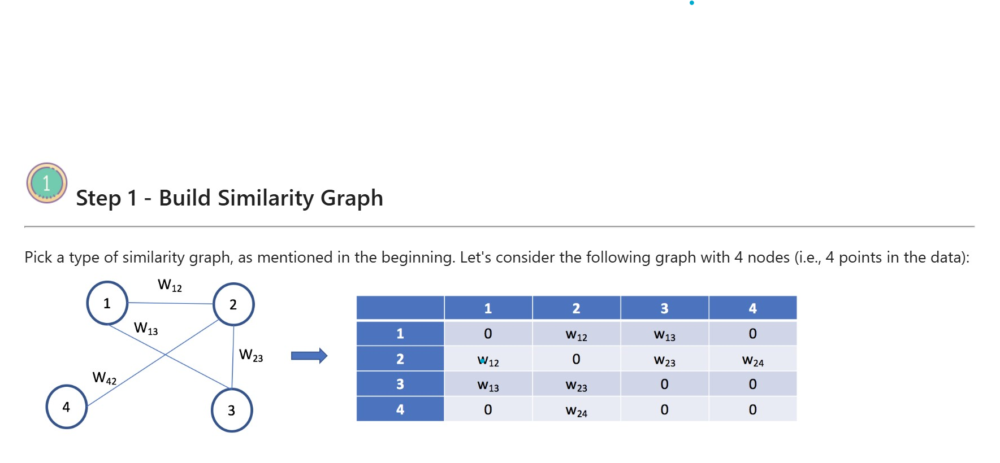

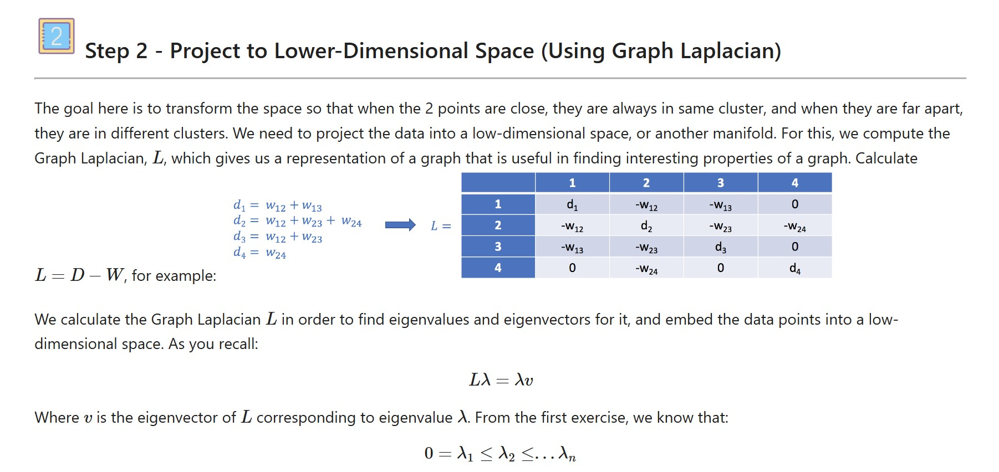

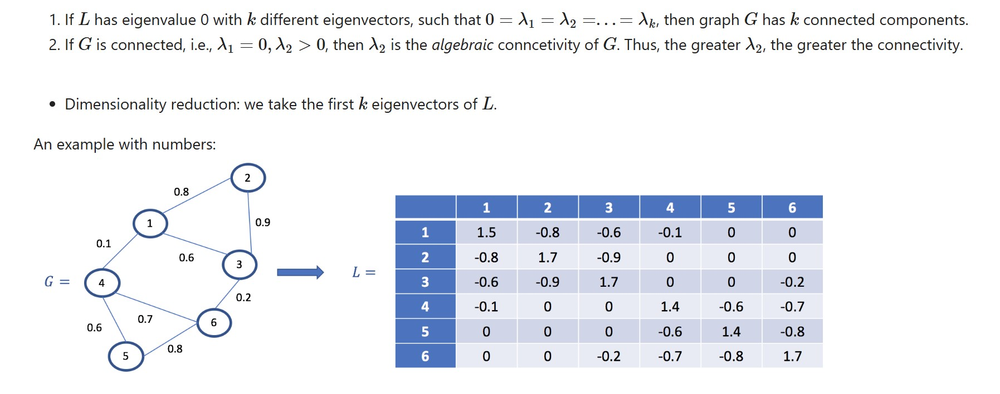

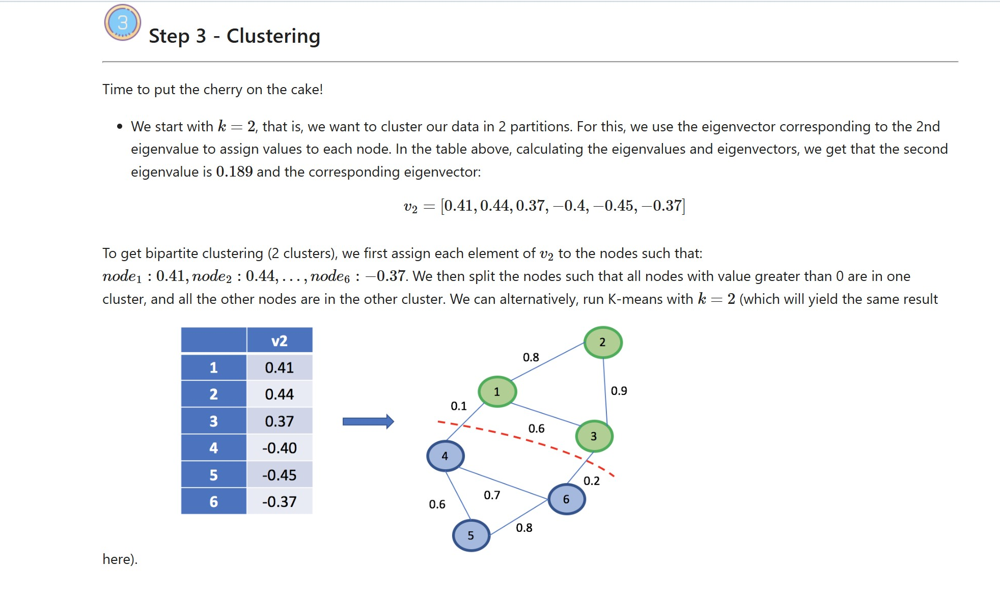

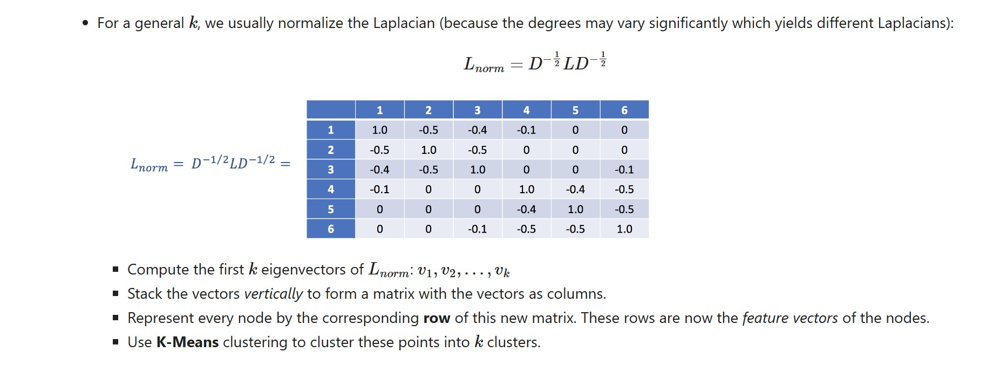

### Implement Spectral Clustering and Compare It to K-Means

c:\Users\LEGION\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


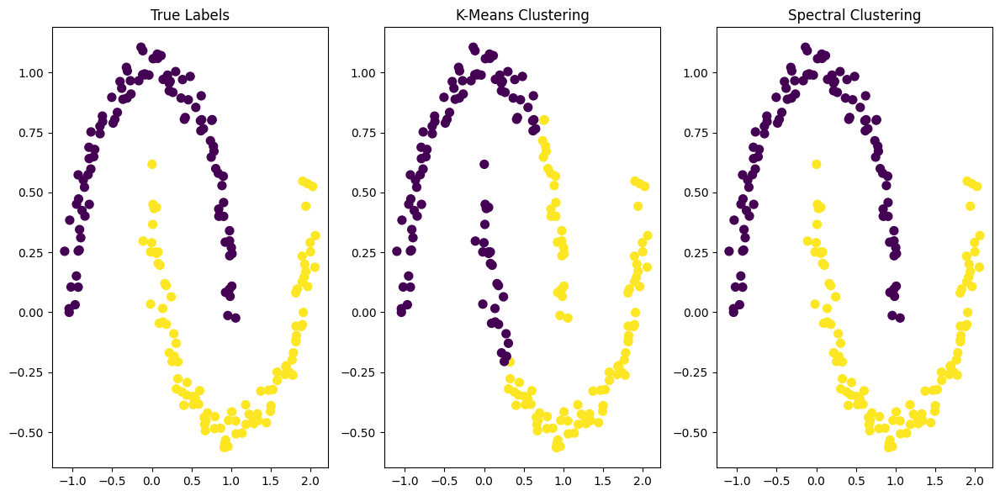

In [45]:
from sklearn.datasets import make_moons
from sklearn.cluster import SpectralClustering, KMeans

X, y = make_moons(n_samples=200, noise=0.05, random_state=42)

kmeans = KMeans(n_clusters=2, random_state=42)
kmeans_labels = kmeans.fit_predict(X)

spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', random_state=42)
spectral_labels = spectral.fit_predict(X)

plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', s=50)
plt.title("True Labels")

plt.subplot(1, 3, 2)
plt.scatter(X[:, 0], X[:, 1], c=kmeans_labels, cmap='viridis', s=50)
plt.title("K-Means Clustering")

plt.subplot(1, 3, 3)
plt.scatter(X[:, 0], X[:, 1], c=spectral_labels, cmap='viridis', s=50)
plt.title("Spectral Clustering")

plt.tight_layout()
plt.show()

In [46]:
from sklearn.metrics import adjusted_rand_score

# Comparing the performances using Adjusted Rand Index (ARI)
kmeans_ari = adjusted_rand_score(y, kmeans_labels)
spectral_ari = adjusted_rand_score(y, spectral_labels)

print(f"Adjusted Rand Index for K-Means: {kmeans_ari:.3f}")
print(f"Adjusted Rand Index for Spectral Clustering: {spectral_ari:.3f}")

Adjusted Rand Index for K-Means: 0.217
Adjusted Rand Index for Spectral Clustering: 1.000


In [47]:
from sklearn.metrics import silhouette_score

# Using Silhouette Score for K-Means and Spectral Clustering
silhouette_kmeans = silhouette_score(X, kmeans_labels)
silhouette_spectral = silhouette_score(X, spectral_labels)

print(f"K-Means Silhouette Score: {silhouette_kmeans:.4f}")
print(f"Spectral Clustering Silhouette Score: {silhouette_spectral:.4f}")


K-Means Silhouette Score: 0.4832
Spectral Clustering Silhouette Score: 0.3224


#### Do this for Karate club


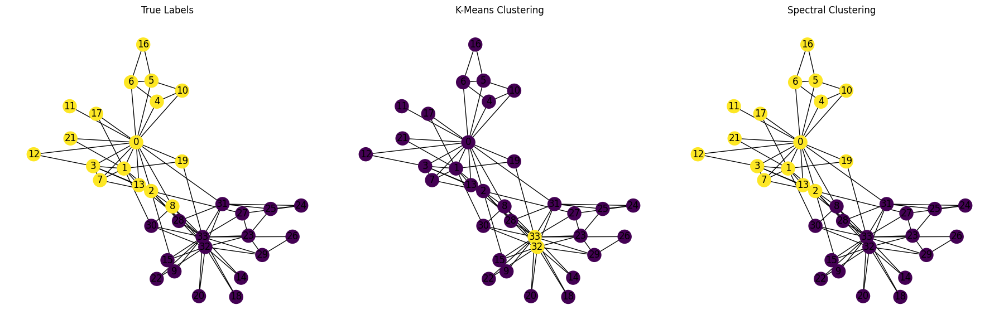

In [48]:
from networkx import karate_club_graph, to_numpy_array

graph = karate_club_graph()
A = to_numpy_array(graph)  # Adjacency matrix

kmeans = KMeans(n_clusters=2, random_state=42)
kmeans_labels_karate = kmeans.fit_predict(A)

spectral = SpectralClustering(n_clusters=2, affinity='precomputed', random_state=42)
spectral_labels_karate = spectral.fit_predict(A)

plt.figure(figsize=(18, 6))
pos = nx.spring_layout(graph, seed=42)

plt.subplot(1, 3, 1)
true_labels_karate = [1 if graph.nodes[i]['club'] == 'Mr. Hi' else 0 for i in graph.nodes]
nx.draw(graph, pos, node_color=true_labels_karate, with_labels=True, cmap='viridis')
plt.title("True Labels")

plt.subplot(1, 3, 2)
nx.draw(graph, pos, node_color=kmeans_labels_karate, with_labels=True, cmap='viridis')
plt.title("K-Means Clustering")

plt.subplot(1, 3, 3)
nx.draw(graph, pos, node_color=spectral_labels_karate, with_labels=True, cmap='viridis')
plt.title("Spectral Clustering")

plt.tight_layout()
plt.show()

In [49]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score

ari_kmeans_karate = adjusted_rand_score(true_labels_karate, kmeans_labels_karate)
ari_spectral_karate = adjusted_rand_score(true_labels_karate, spectral_labels_karate)

silhouette_kmeans_karate = silhouette_score(A, kmeans_labels_karate, metric='precomputed')
silhouette_spectral_karate = silhouette_score(A, spectral_labels_karate, metric='precomputed')

print(f"K-Means Evaluation Metrics:")
print(f"Adjusted Rand Index (ARI): {ari_kmeans_karate:.4f}")
print(f"Silhouette Score: {silhouette_kmeans_karate:.4f}\n")

print(f"Spectral Clustering Evaluation Metrics:")
print(f"Adjusted Rand Index (ARI): {ari_spectral_karate:.4f}")
print(f"Silhouette Score: {silhouette_spectral_karate:.4f}")


K-Means Evaluation Metrics:
Adjusted Rand Index (ARI): 0.0072
Silhouette Score: -0.0568

Spectral Clustering Evaluation Metrics:
Adjusted Rand Index (ARI): 0.8823
Silhouette Score: -0.8966
